<a href="https://colab.research.google.com/github/Samy-Annasri/Internship-Adversarial-time-series/blob/main/adversial_attack.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Note:
For the moment, everything is not perfect. For example, I think the BIM attack might be implemented incorrectly based on the results. Moreover, a lot of the code could be refactored to be more efficient and avoid repetition. I also tried to write comments in English, but I believe there are many grammatical mistakes in the notebook, which I will correct when I have time.
This is just what I have done over the past two weeks :)

# Objective of this Notebook

This notebook explores the implementation of different AI models **LSTM**, **RNN** and **CNN** for **time series forecasting adversial attack**.

To achieve this, I use two datasets:

- **GlobalLandTemperaturesByCity**: This dataset is used to forecast temperatures in France based on historical climate data.

    https://www.kaggle.com/datasets/berkeleyearth/climate-change-earth-surface-temperature-data?resource=download&select=GlobalLandTemperaturesByCity.csv)
- **Google Stock Data (last 5 years)**: This dataset is used in a similar way to predict Google's stock price trends.

    https://www.nasdaq.com/market-activity/stocks/goog/historical?page=126&rows_per_page=10&timeline=y5

For running this notebook, you just need when you open the notebook to import the CSV file and check that the name is the same as on the pd.read_csv() for both dataset implementation.

After building and evaluating the forecasting models, I implement several **adversarial attacks**, including **FGSM**, **BIM**, and a more recent method known as **TCA** (for more details, see the "Adversarial part" section below).

To assess the impact of these attacks, I use the following metrics:

- **MAE** (Mean Absolute Error)  
- **RMSE** (Root Mean Square Error)  
- **SIM** (Scalar Similarity)

An adversarial attack is considered effective if it satisfies the following three criteria:

- **Effectiveness** — it significantly alters the model’s output.  
- **Stealthiness** — it introduces minimal perturbation to avoid detection.  
- **Rationality** — the perturbation remains within a reasonable and realistic range.

To finish, their is for each DataSet a analysis and Question part when i just talk about the result and some strange thing in the result that i can't explain for the moment

# time series frensh temp data

In [ ]:
#import everything
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split
import matplotlib.pyplot as plt
from IPython.display import display

In [ ]:
# load CSV
df = pd.read_csv("GlobalLandTemperaturesByCity.csv")

In [ ]:
df_country = df[["dt", "AverageTemperature", "Country"]].copy()
df_country['dt'] = pd.to_datetime(df_country['dt'])

# filter Brésil and for month
frace_data = df_country[df_country['Country'] == 'France']
france_monthly = frace_data.groupby(frace_data['dt'].dt.to_period('M'))['AverageTemperature'].mean().reset_index()
france_monthly['dt'] = france_monthly['dt'].dt.to_timestamp()

# check if there is any None value
temps = france_monthly['AverageTemperature'].values
if np.any(np.isnan(temps)):
    temps = pd.Series(temps).interpolate().values
temps = temps.astype(np.float32)

# Normalization
temps = (temps - temps.min()) / (temps.max() - temps.min())

# séquences of 1 years
sequence_length = 12
X, Y, dates = [], [], []
for i in range(len(temps) - sequence_length):
    X.append(temps[i:i+sequence_length])  # 12 month before
    Y.append(temps[i+sequence_length]) # Y[i] = y[i+11]
    dates.append(france_monthly['dt'][i + sequence_length])

X = torch.tensor(X).unsqueeze(-1)  # (N, seq_len, 1)
Y = torch.tensor(Y).unsqueeze(-1).float()  # (N, 1)

# dataset creation
dataset = TensorDataset(X, Y)
train_size = int(len(dataset) * 0.8)
test_size = len(dataset) - train_size
train_set, test_set = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
test_loader = DataLoader(test_set, batch_size=32)

print("Taille de X :", X.shape)
print("Taille de Y :", Y.shape)

Taille de X : torch.Size([3227, 12, 1])
Taille de Y : torch.Size([3227, 1])


## LSTM model pytorch

In [ ]:
class SimpleLSTM(torch.nn.Module):
  def __init__(self, input_size, hidden_size, output_size, num_layers, dropout=0.2):
    super(SimpleLSTM, self).__init__()
    self.lstm = torch.nn.LSTM(input_size, hidden_size, num_layers,batch_first=True, dropout=dropout)
    self.linear = torch.nn.Linear(hidden_size, output_size)

  def forward(self, x):
    x, _ = self.lstm(x)
    x = self.linear(x[:, -1, :])
    return x

## Training phase

In [ ]:
def train_model(model, loss_fn, optimizer, num_epochs):
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for batch_X, batch_Y in train_loader:
          output = model(batch_X)
          loss = loss_fn(output, batch_Y)
          optimizer.zero_grad()
          loss.backward()
          optimizer.step()
          total_loss += loss.item()

        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {total_loss / len(train_loader):.4f}")

In [ ]:
model = SimpleLSTM(input_size=1, hidden_size=64, output_size=1, num_layers=2) #LSTM Model
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model,loss_fn,optimizer,num_epochs) #train the model

Epoch 1/10, Loss: 0.0773
Epoch 2/10, Loss: 0.0308
Epoch 3/10, Loss: 0.0065
Epoch 4/10, Loss: 0.0054
Epoch 5/10, Loss: 0.0049
Epoch 6/10, Loss: 0.0047
Epoch 7/10, Loss: 0.0045
Epoch 8/10, Loss: 0.0045
Epoch 9/10, Loss: 0.0045
Epoch 10/10, Loss: 0.0042


## print result

In [ ]:
# Creation of the tab result for plotting adversial attack result
models_temp = ['LSTM','RNN','CNN']
metrics_temp = ['MAE', "RSME", 'SIM']

row_index = pd.MultiIndex.from_product([models_temp, metrics_temp], names=['Model', 'Metric'])

attacks = ['NA', 'FGSM', 'BIM', 'TCA']
epsilons = {
    'NA': [0],
    'FGSM': [0.01, 0.1, 0.2],
    'BIM': [0.01, 0.1, 0.2],
    'TCA': [0.01, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab_temp = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

display(res_tab_temp)

Attack         NA FGSM            BIM            TCA          
ε            0.00 0.01 0.10 0.20 0.01 0.10 0.20 0.01 0.10 0.20
Model Metric                                                  
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
CNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN

In [ ]:
model.eval()
with torch.no_grad():
    predictions = [] #store predictions
    true_values = [] #store the true value y
    test_indices = []  # Store indices for test data
    for i, (X_test, Y_test) in enumerate(test_loader):
        output = model(X_test)
        predictions.append(output.numpy())
        true_values.append(Y_test.numpy())
        # Store indices for the current batch
        batch_size = X_test.shape[0]
        start_idx = train_size + i * 32
        end_idx = min(start_idx + batch_size, len(dates))
        test_indices.extend(range(start_idx, end_idx))

    predictions = np.concatenate(predictions, axis=0).squeeze()
    true_values = np.concatenate(true_values, axis=0).squeeze()
    test_dates = [dates[i] for i in test_indices]  # Align dates with test data

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# print the result with plenty of metrics
mae = mean_absolute_error(true_values, predictions)
mse = mean_squared_error(true_values, predictions)
rmse = np.sqrt(mse)
r2 = r2_score(true_values, predictions)

print(f"MAE: {mae:.4f}")
print(f"MSE: {mse:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"R² score: {r2:.4f}")


MAE: 0.0494
MSE: 0.0039
RMSE: 0.0628
R² score: 0.9193


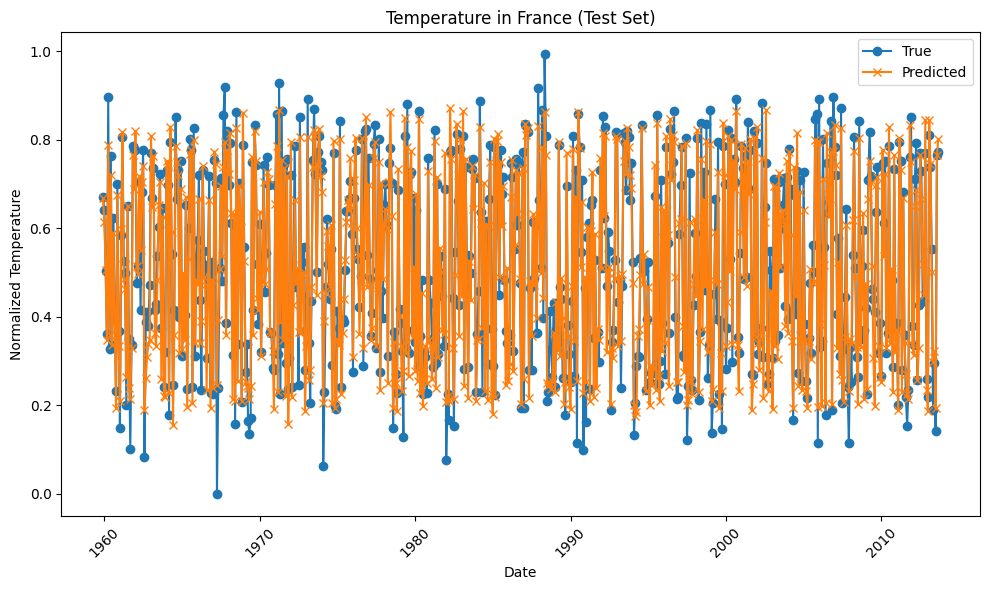

In [ ]:
# first plot (very bad way to represent the data result) plot everything (normalize and all the data/prediction/true value)
plt.figure(figsize=(10, 6))
plt.plot(test_dates, true_values, label='True', marker='o')
plt.plot(test_dates, predictions, label='Predicted', marker='x')
plt.xlabel('Date')
plt.ylabel('Normalized Temperature')
plt.title('Temperature in France (Test Set)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

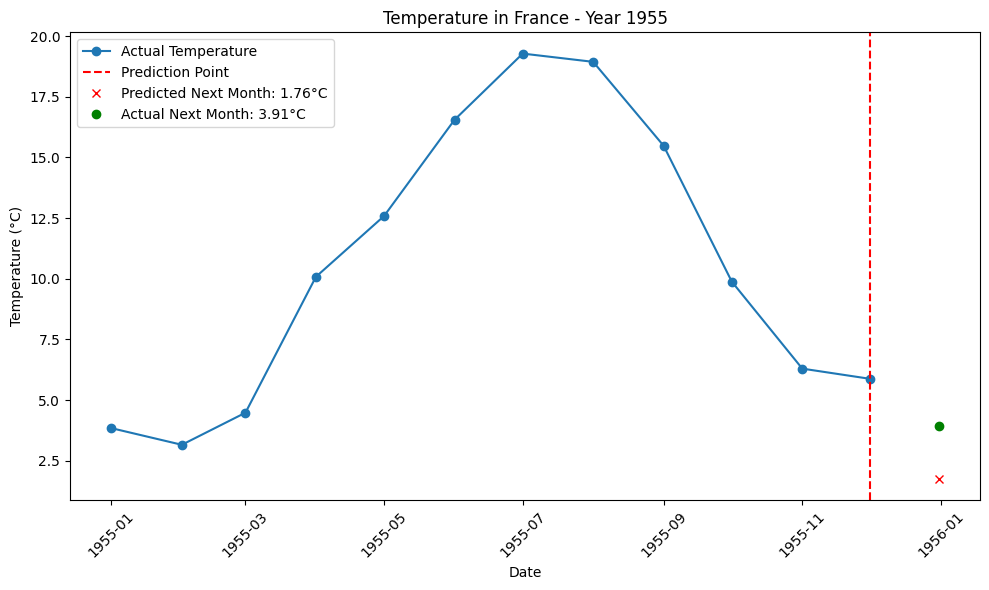

Predicted temperature for 1955 (next month): 1.76 °C
Actual temperature for 1955 (next month): 3.91 °C


In [ ]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader, random_split
import matplotlib.pyplot as plt

# not really important I think but not bad
# Function to plot and predict for a specific year, including the actual value if available
def plot_predict_year(model, year, france_monthly, sequence_length=12, temps=temps):
    # Filter data for the given year
    year_data = france_monthly[france_monthly['dt'].dt.year == year].copy()
    if len(year_data) < sequence_length:
        print(f"Not enough data for year {year}. Need at least {sequence_length} months.")
        return None

    # Get the data and dates for the year
    temps_year = year_data['AverageTemperature'].values
    dates_year = year_data['dt'].values
    temps_year = (temps_year - temps.min()) / (temps.max() - temps.min())

    # Prepare input sequence (last sequence_length months)
    input_seq = torch.tensor(temps_year[-sequence_length:]).unsqueeze(0).unsqueeze(-1).float()

    # Predict
    model.eval()
    with torch.no_grad():
        prediction = model(input_seq)

    # Denormalize the prediction
    prediction_denorm = prediction * (temps.max() - temps.min()) + temps.min()
    predicted_value = prediction_denorm.item()

    # Find the actual value for the next month (if available)
    last_date = dates_year[-1]
    next_month_date = last_date + pd.Timedelta(days=30)  # Approximate next month
    actual_next_value = None
    # Look for the actual value in france_monthly
    next_month_data = france_monthly[france_monthly['dt'] >= next_month_date].head(1)
    if not next_month_data.empty:
        actual_next_value = next_month_data['AverageTemperature'].values[0]

    # Plot
    plt.figure(figsize=(10, 6))
    # Plot actual temperatures for the year
    plt.plot(dates_year, temps_year * (temps.max() - temps.min()) + temps.min(), label='Actual Temperature', marker='o')
    plt.axvline(x=last_date, color='r', linestyle='--', label='Prediction Point')
    # Plot predicted value for the next month
    plt.plot(next_month_date, predicted_value, 'rx', label=f'Predicted Next Month: {predicted_value:.2f}°C')
    # Plot actual value for the next month (if available)
    if actual_next_value is not None:
        plt.plot(next_month_date, actual_next_value, 'go', label=f'Actual Next Month: {actual_next_value:.2f}°C')

    plt.xlabel('Date')
    plt.ylabel('Temperature (°C)')
    plt.title(f'Temperature in France - Year {year}')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    return predicted_value, actual_next_value

year_to_predict = 1955
result = plot_predict_year(model, year_to_predict, france_monthly)
if result is not None:
    predicted_temp, actual_temp = result
    print(f"Predicted temperature for {year_to_predict} (next month): {predicted_temp:.2f} °C")
    if actual_temp is not None:
        print(f"Actual temperature for {year_to_predict} (next month): {actual_temp:.2f} °C")

In [ ]:
# Computes scalar similarity (cosine similarity) between true and predicted values.
# Higher values indicate that adversarial predictions remain directionally aligned
# with the true values, suggesting stealthy and rational attacks!
def scalar_similarity(y_true, y_pred):
    numerator = np.dot(y_true, y_pred)
    denominator = np.linalg.norm(y_true) * np.linalg.norm(y_pred)
    if denominator == 0:
        return 0.0
    return numerator / denominator

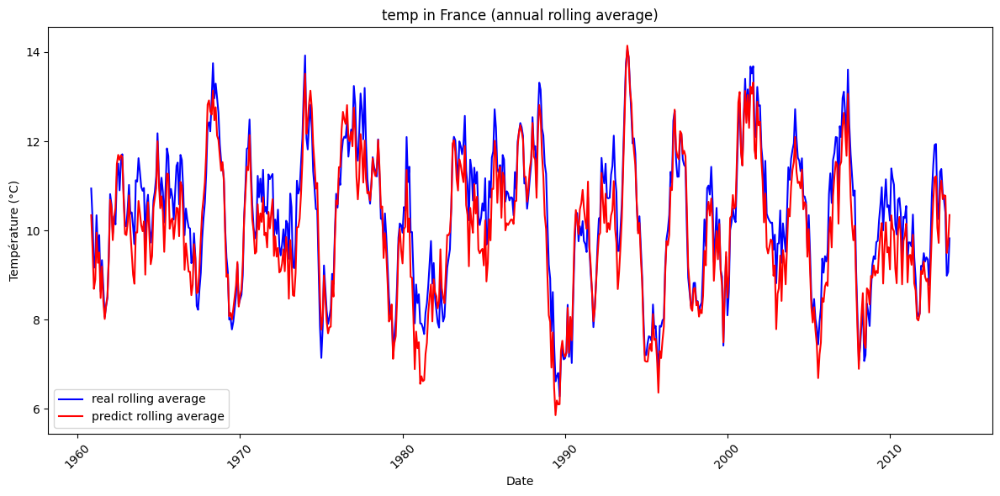

In [ ]:
temps_min = france_monthly['AverageTemperature'].min()
temps_max = france_monthly['AverageTemperature'].max()

true_values_denorm = true_values * (temps_max - temps_min) + temps_min
predictions_denorm = predictions * (temps_max - temps_min) + temps_min

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

res_tab_temp.loc[('LSTM', 'MAE'), ('NA', '0.00')] = mae
res_tab_temp.loc[('LSTM', 'SIM'), ('NA', '0.00')] = sim
res_tab_temp.loc[('LSTM', 'RSME'), ('NA', '0.00')] = rsme

# plot on month average temp in france (more easy to see the result)
plt.figure(figsize=(12, 6))
plt.plot(test_dates, true_values_denorm_month, label='real rolling average', color='blue')
plt.plot(test_dates, predictions_denorm_month, label='predict rolling average', color='red')
plt.xlabel('Date')
plt.ylabel('Température (°C)')
plt.title('temp in France (annual rolling average)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Adversial part

In [ ]:
# func for denormalize the data
def denormalize(data, min_val, max_val):
    return data * (max_val - min_val) + min_val

In [ ]:
"""
Fast Gradient Sign Method (FGSM) generates adversarial examples by adding
a small perturbation to the input based on the gradient of the loss.

The perturbation is computed in the direction that increases the model's
loss the most.

But In the contexte of time-series data, the perturbations must be
handled more carefully to remain realistic.

This is easy to add a lot of noise but that is going to be really easy to
see the attack

Formula:
    x_adv = x + epsilon * sign(∇_x J(θ, x, y))
"""
def fgsm_attack(model, loss_fn, x, y, epsilon):
    x_adv = x.clone().detach().requires_grad_(True)
    model.eval()

    output = model(x_adv)
    loss = loss_fn(output, y)
    loss.backward()

    # Compute perturbation using the sign of the gradient
    perturbation = epsilon * x_adv.grad.sign()
    # Apply perturbation to the input
    x_adv = x_adv + perturbation
    return x_adv.detach()

'''
The Basic Iterative Method (BIM) is an extension of FGSM that applies the attack iteratively,
performing multiple small perturbations instead of a single step.
It also includes a clipping mechanism to ensure the total perturbation stays within the epsilon limit.
'''
def bim_attack(model, loss_fn, x, y, epsilon, alpha, num_iter):
    model.eval()
    x_adv = x.clone().detach()
    eta = torch.zeros_like(x_adv)

    for _ in range(num_iter):
        x_adv_ = torch.clamp(x + eta, 0, 1).detach().clone().requires_grad_(True)
        output = model(x_adv_)
        loss = loss_fn(output, y)

        model.zero_grad()
        loss.backward()

        grad = x_adv_.grad.data
        eta = eta + alpha * grad.sign()
        eta = torch.clamp(eta, -epsilon, epsilon)

    x_adv_final = torch.clamp(x + eta, 0, 1)
    return x_adv_final.detach()



In [ ]:
from torch.nn import CosineSimilarity


"""
Temporal Characteristics-based Adversarial Attack (TCA) aims to craft adversarial examples
that maximize the model's loss while preserving high cosine similarity with the original input.
This ensures the perturbations remain stealthy by maintaining temporal characteristics and
the overall direction of input sequences.

TCA can be seen as an extension of the Basic Iterative Method (BIM), where small gradient-based
perturbations are applied iteratively. However, at each step, the method selects updates that
maximize the cosine similarity between the adversarial and original inputs, thus preserving
the temporal structure and making the attack more stealthy.

for learn more about this attack :
https://www.sciencedirect.com/science/article/abs/pii/S0957417424028173
"""

def tca_attack(model, loss_fn, x, y, epsilon, alpha=None, num_iter=20):
    model.eval()
    x_adv = x.clone().detach()
    cos_sim = CosineSimilarity(dim=1)

    if alpha is None:
        alpha = epsilon / num_iter

    for _ in range(num_iter):
        x_adv = x_adv.clone().detach().requires_grad_(True)
        output = model(x_adv)
        loss = loss_fn(output, y)
        loss.backward()

        eta = alpha * x_adv.grad.sign()
        x_tilde = x_adv + eta
        x_tilde = torch.clamp(x_tilde, x - epsilon, x + epsilon)

        sim_tilde = cos_sim(x.view(x.size(0), -1), x_tilde.detach().view(x.size(0), -1))
        sim_plus = cos_sim(x.view(x.size(0), -1), (x + epsilon).view(x.size(0), -1))
        sim_minus = cos_sim(x.view(x.size(0), -1), (x - epsilon).view(x.size(0), -1))

        x_adv_new = x_adv.clone().detach()
        for i in range(x.size(0)):
            if sim_tilde[i] > sim_plus[i] and sim_tilde[i] > sim_minus[i]:
                x_adv_new[i] = x_tilde[i]
            elif sim_plus[i] >= sim_minus[i]:
                x_adv_new[i] = (x + epsilon)[i]
            else:
                x_adv_new[i] = (x - epsilon)[i]

        x_adv = x_adv_new

    return x_adv.detach()

In [ ]:
def run_attack(model, loss_fn, test_loader, attack_fn, **attack_kwargs):
    model.eval()
    adv_predictions, true_values = [], []

    for X_test, Y_test in test_loader:
        X_test = X_test.clone().detach()
        Y_test = Y_test.clone().detach()
        X_adv = attack_fn(model, loss_fn, X_test, Y_test, **attack_kwargs)
        with torch.no_grad():
            output = model(X_adv)
        adv_predictions.append(output.numpy())
        true_values.append(Y_test.numpy())

    adv_predictions = np.concatenate(adv_predictions).squeeze()
    true_values = np.concatenate(true_values).squeeze()
    return adv_predictions, true_values


In [ ]:
def plot_rolling_attacks_temp_fr(test_dates, true_vals, pred_vals, adv_vals, label, eps):
    true_smooth = pd.Series(true_vals).rolling(window=12).mean()
    pred_smooth = pd.Series(pred_vals).rolling(window=12).mean()
    adv_smooth = pd.Series(adv_vals).rolling(window=12).mean()

    plt.figure(figsize=(12, 6))
    plt.plot(test_dates, true_smooth, label='real rolling average', color='blue')
    plt.plot(test_dates, pred_smooth, label='prediction rolling average', color='red')
    plt.plot(test_dates, adv_smooth, label=f'{label} (eps={eps})', color='orange')

    plt.xlabel('Date')
    plt.ylabel('Température (°C)')
    plt.title(f'Temperature Trend – {label} Attack (epsilon={eps})')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [ ]:
def run_and_log_attack(model, model_name, loss_fn, test_loader, attack_fn, attack_name, epsilon_values,
                       temps_min, temps_max, predictions, test_dates, res_tab_temp,
                       alpha=None, num_iter=None):
    predictions_denorm = denormalize(predictions, temps_min, temps_max)

    for eps in epsilon_values:
        kwargs = {'epsilon': eps}
        if alpha is not None:
            kwargs['alpha'] = alpha
        if num_iter is not None:
            kwargs['num_iter'] = num_iter

        adv_preds, true_vals = run_attack(model, loss_fn, test_loader, attack_fn, **kwargs)
        adv_preds_denorm = denormalize(adv_preds, temps_min, temps_max)
        true_vals_denorm = denormalize(true_vals, temps_min, temps_max)

        mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
        sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
        rsme = np.sqrt(mean_squared_error(true_vals_denorm, adv_preds_denorm))

        eps_str = f"{eps:.2f}"
        res_tab_temp.loc[(model_name, 'MAE'), (attack_name, eps_str)] = mae
        res_tab_temp.loc[(model_name, 'SIM'), (attack_name, eps_str)] = sim
        res_tab_temp.loc[(model_name, 'RSME'), (attack_name, eps_str)] = rsme

        print(f"{model_name} | {attack_name} – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")
        plot_rolling_attacks_temp_fr(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm,
                                     label=f"{attack_name} ({model_name})", eps=eps)

LSTM | FGSM – Epsilon 0.01 – Adversarial MAE: 1.6673 | SIM: 0.9865


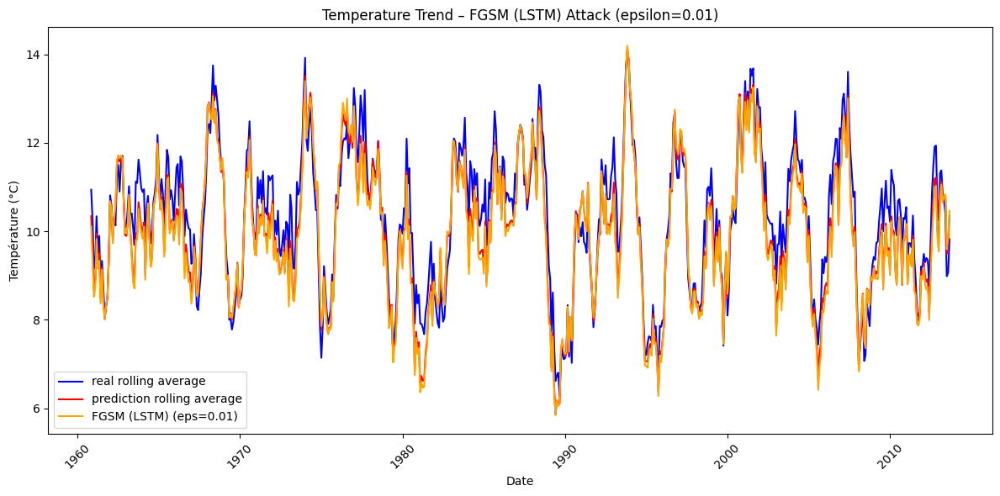

LSTM | FGSM – Epsilon 0.1 – Adversarial MAE: 4.6337 | SIM: 0.9172


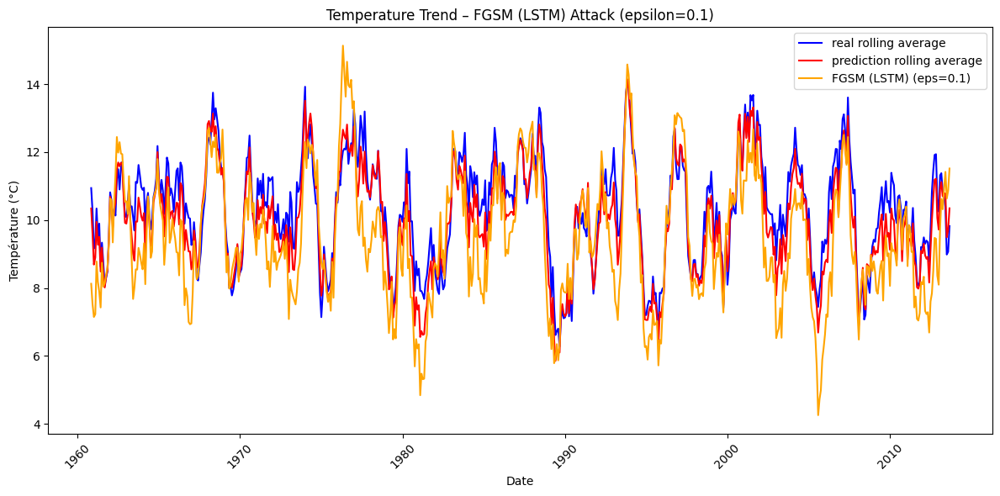

LSTM | FGSM – Epsilon 0.2 – Adversarial MAE: 7.6102 | SIM: 0.7938


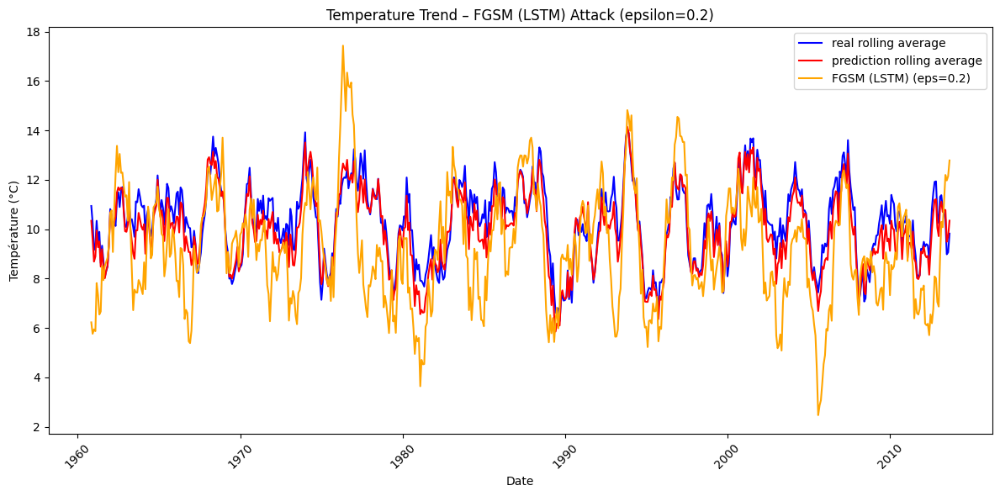

LSTM | BIM – Epsilon 0.01 – Adversarial MAE: 1.6671 | SIM: 0.9865


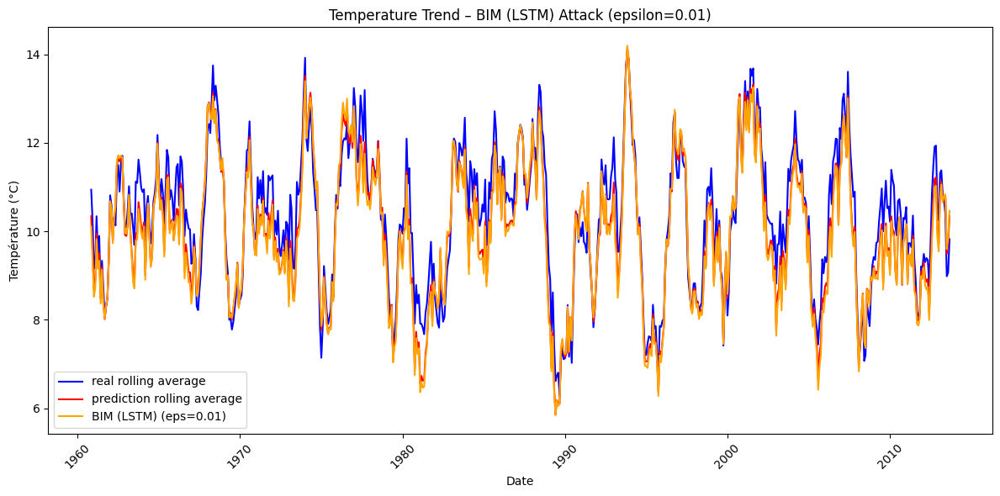

LSTM | BIM – Epsilon 0.1 – Adversarial MAE: 4.6484 | SIM: 0.9167


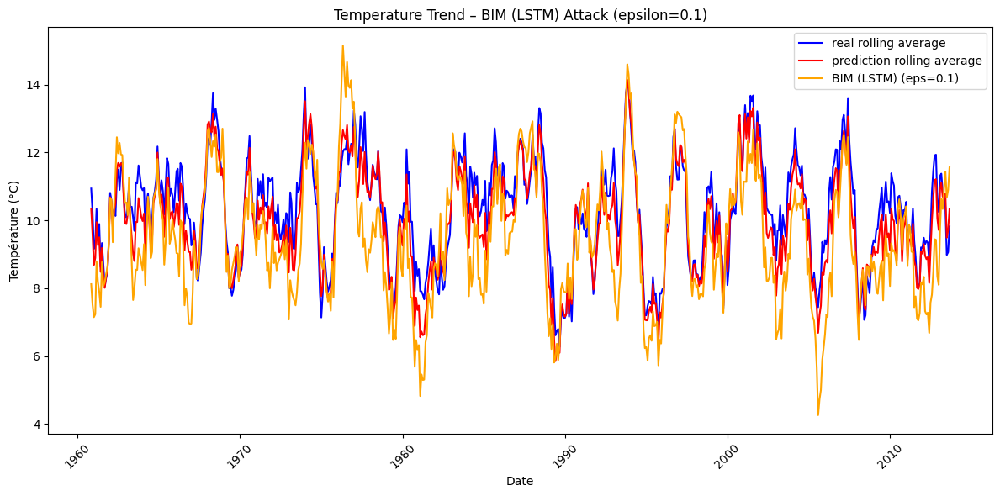

LSTM | BIM – Epsilon 0.2 – Adversarial MAE: 7.6241 | SIM: 0.7925


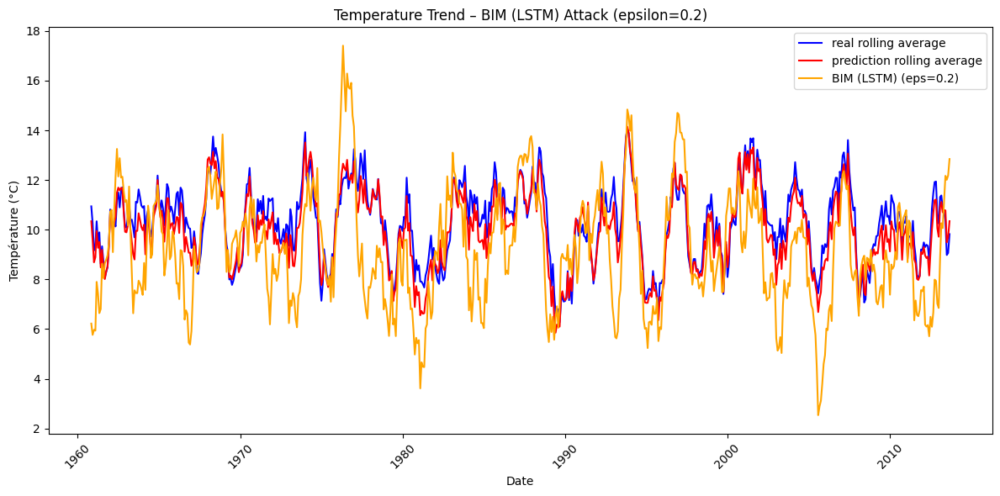

LSTM | TCA – Epsilon 0.01 – Adversarial MAE: 1.3507 | SIM: 0.9897


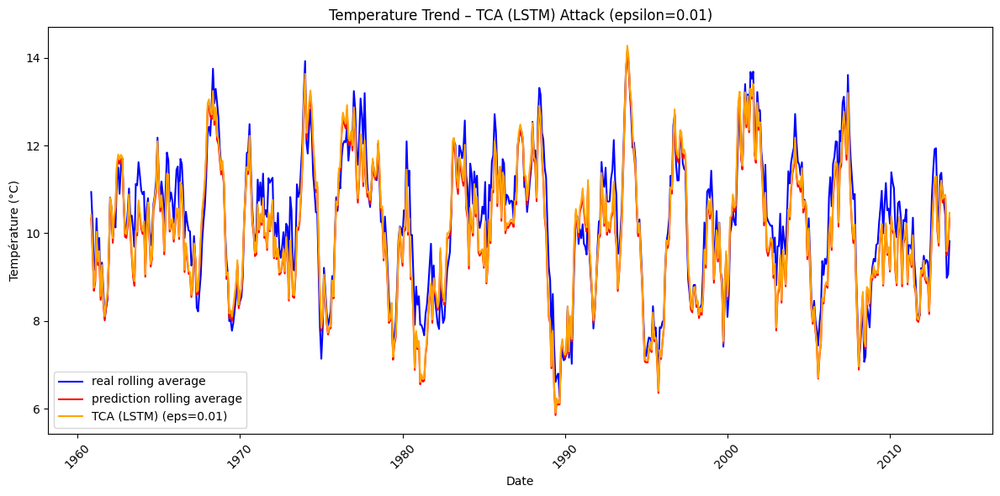

LSTM | TCA – Epsilon 0.1 – Adversarial MAE: 1.7434 | SIM: 0.9869


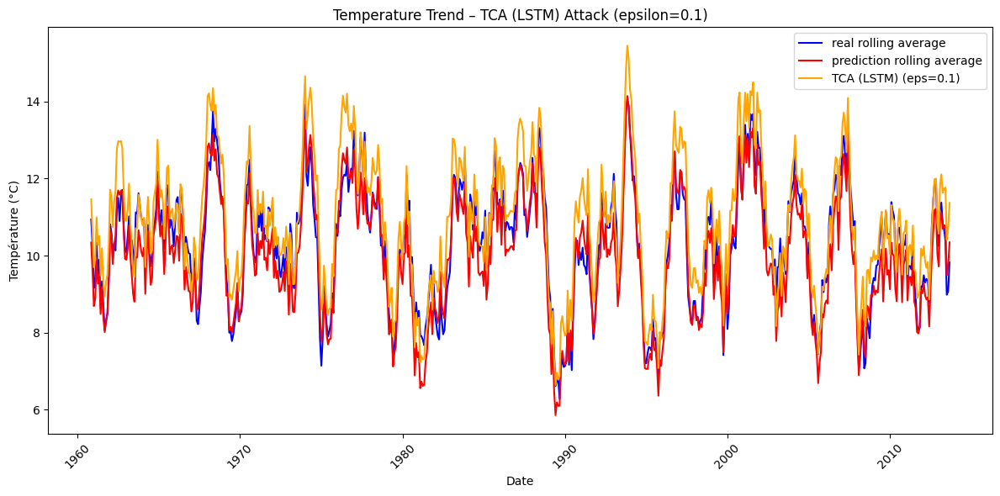

LSTM | TCA – Epsilon 0.2 – Adversarial MAE: 2.7794 | SIM: 0.9841


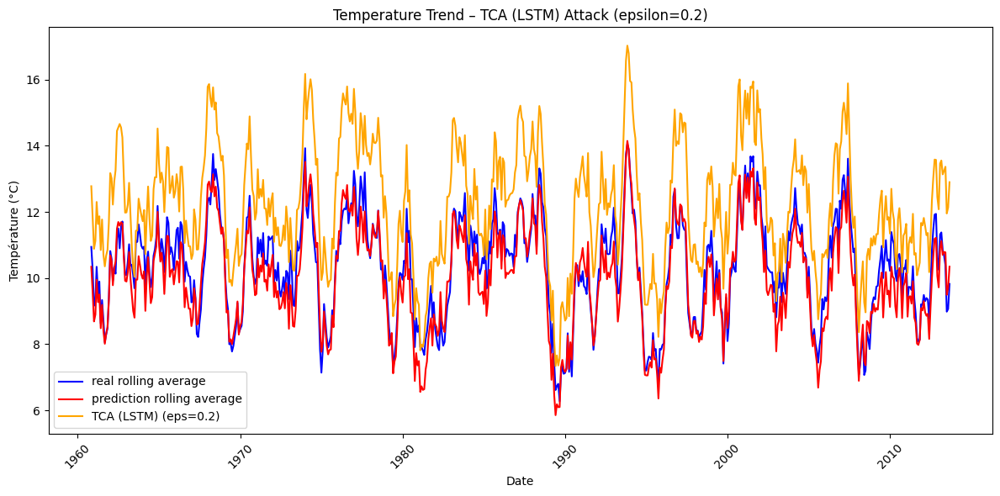

In [ ]:
epsilon_values = [0.01, 0.1, 0.2]
alpha = 0.01
iters = 20

# FGSM
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model,'LSTM', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


## RNN PART

In [ ]:
class SimpleRNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers):
        super(SimpleRNN, self).__init__()
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.rnn(x)
        out = self.fc(out[:, -1, :])
        return out

In [ ]:
model_temp_RNN = SimpleRNN(input_size=1, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model_temp_RNN.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model_temp_RNN,loss_fn,optimizer,num_epochs)

Epoch 1/10, Loss: 0.0301
Epoch 2/10, Loss: 0.0052
Epoch 3/10, Loss: 0.0045
Epoch 4/10, Loss: 0.0042
Epoch 5/10, Loss: 0.0039
Epoch 6/10, Loss: 0.0039
Epoch 7/10, Loss: 0.0037
Epoch 8/10, Loss: 0.0038
Epoch 9/10, Loss: 0.0038
Epoch 10/10, Loss: 0.0040


In [ ]:
model_temp_RNN.eval()
with torch.no_grad():
    predictions = [] #store predictions
    true_values = [] #store the true value y
    test_indices = []  # Store indices for test data
    for i, (X_test, Y_test) in enumerate(test_loader):
        output = model_temp_RNN(X_test)
        predictions.append(output.numpy())
        true_values.append(Y_test.numpy())
        # Store indices for the current batch
        batch_size = X_test.shape[0]
        start_idx = train_size + i * 32
        end_idx = min(start_idx + batch_size, len(dates))
        test_indices.extend(range(start_idx, end_idx))

    predictions = np.concatenate(predictions, axis=0).squeeze()
    true_values = np.concatenate(true_values, axis=0).squeeze()
    test_dates = [dates[i] for i in test_indices]  # Align dates with test data

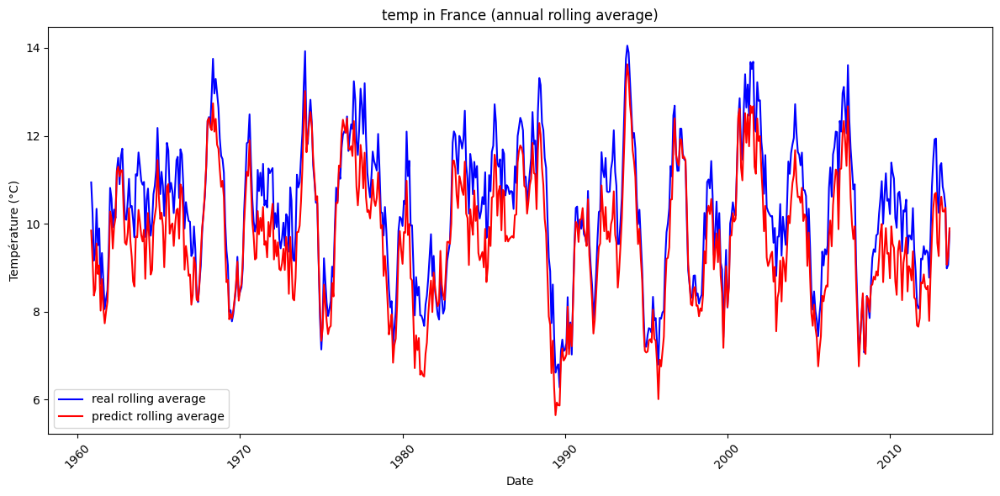

In [ ]:
temps_min = france_monthly['AverageTemperature'].min()
temps_max = france_monthly['AverageTemperature'].max()

true_values_denorm = true_values * (temps_max - temps_min) + temps_min
predictions_denorm = predictions * (temps_max - temps_min) + temps_min

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

res_tab_temp.loc[('RNN', 'MAE'), ('NA', '0.00')] = mae
res_tab_temp.loc[('RNN', 'SIM'), ('NA', '0.00')] = sim
res_tab_temp.loc[('RNN', 'RSME'), ('NA', '0.00')] = rsme

# plot on month average temp in france (more easy to see the result)
plt.figure(figsize=(12, 6))
plt.plot(test_dates, true_values_denorm_month, label='real rolling average', color='blue')
plt.plot(test_dates, predictions_denorm_month, label='predict rolling average', color='red')
plt.xlabel('Date')
plt.ylabel('Température (°C)')
plt.title('temp in France (annual rolling average)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

RNN | FGSM – Epsilon 0.01 – Adversarial MAE: 1.7040 | SIM: 0.9875


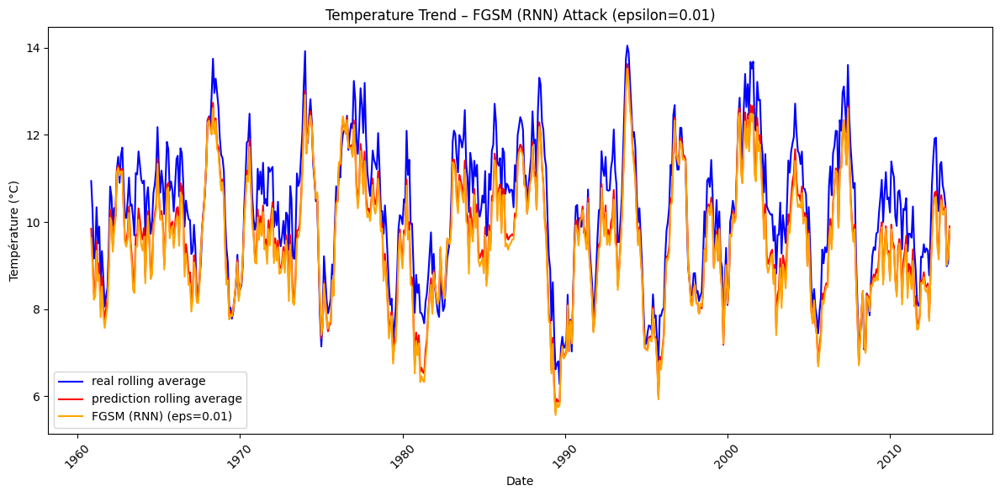

RNN | FGSM – Epsilon 0.1 – Adversarial MAE: 4.5587 | SIM: 0.9205


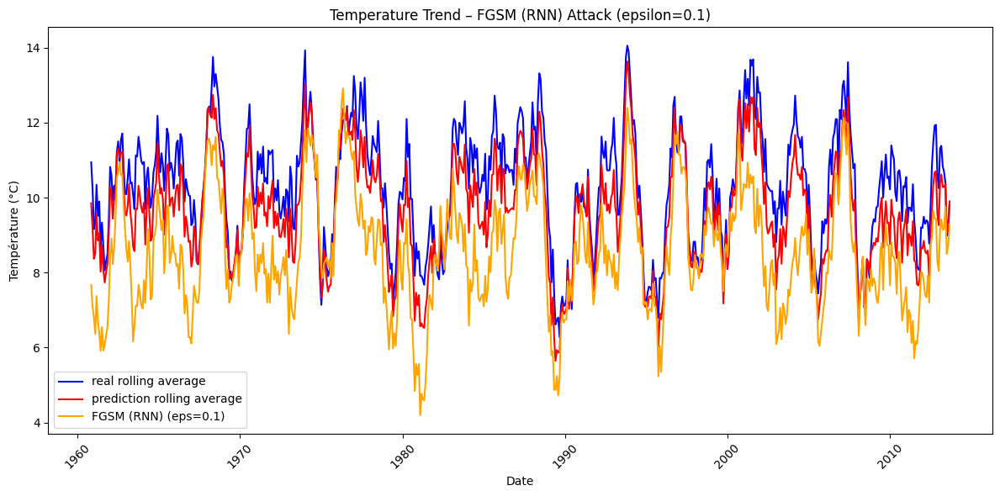

RNN | FGSM – Epsilon 0.2 – Adversarial MAE: 7.6334 | SIM: 0.7638


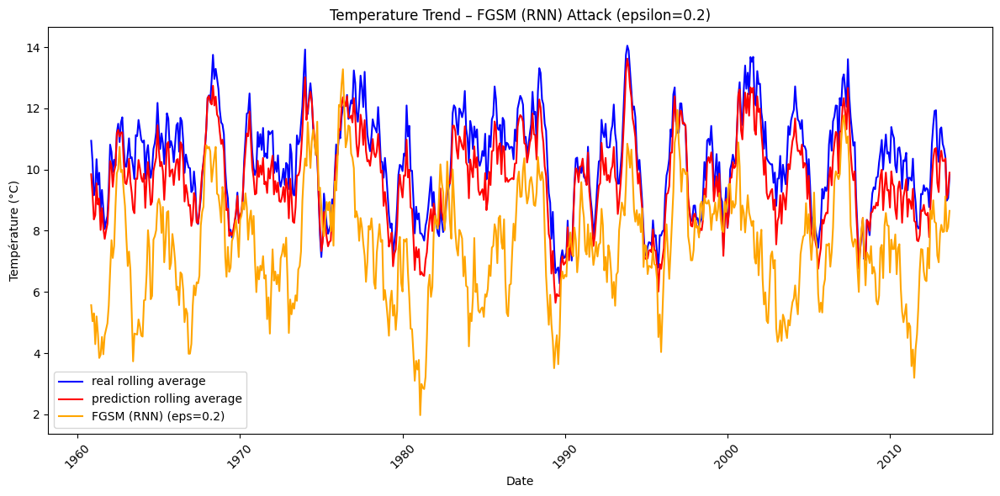

RNN | BIM – Epsilon 0.01 – Adversarial MAE: 1.7039 | SIM: 0.9875


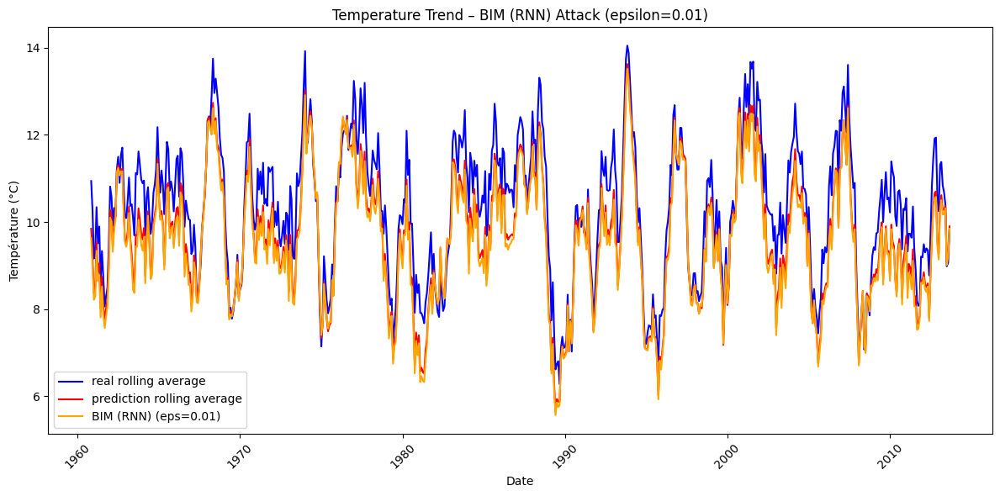

RNN | BIM – Epsilon 0.1 – Adversarial MAE: 4.5643 | SIM: 0.9203


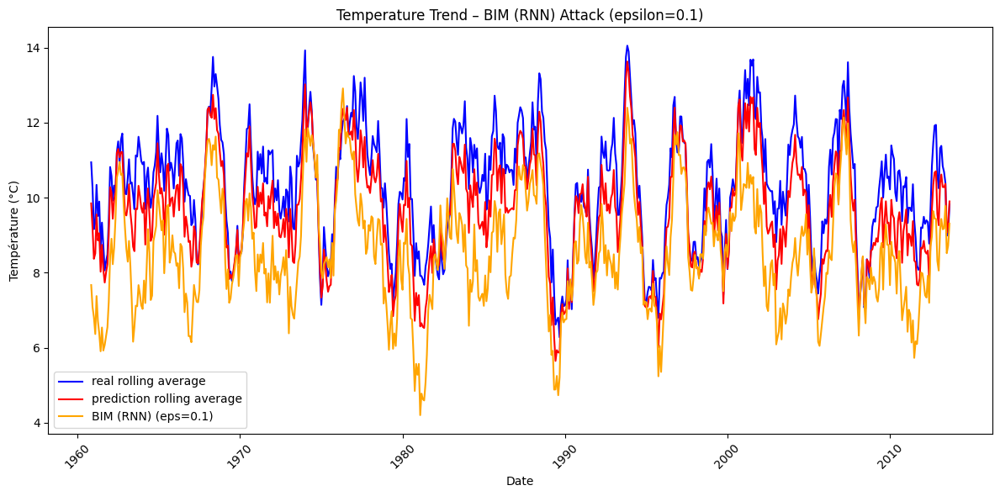

RNN | BIM – Epsilon 0.2 – Adversarial MAE: 7.6020 | SIM: 0.7650


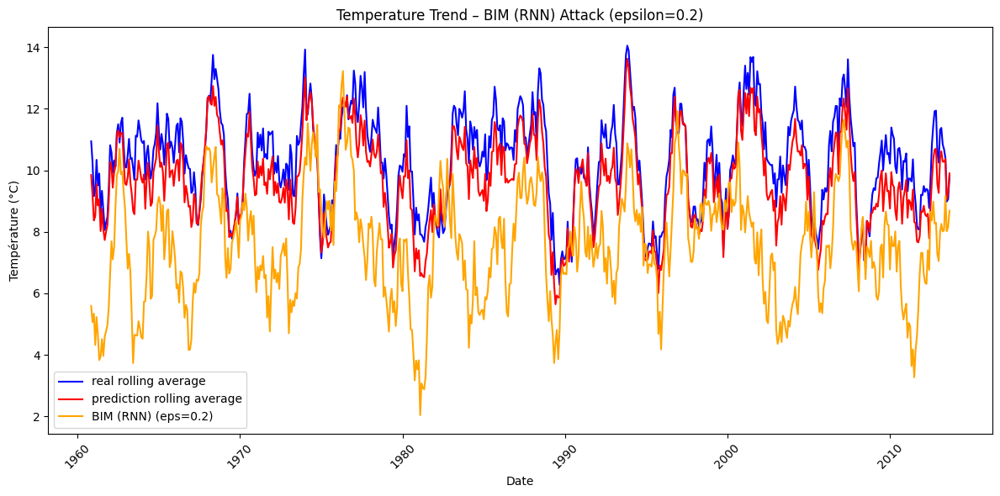

RNN | TCA – Epsilon 0.01 – Adversarial MAE: 1.3723 | SIM: 0.9905


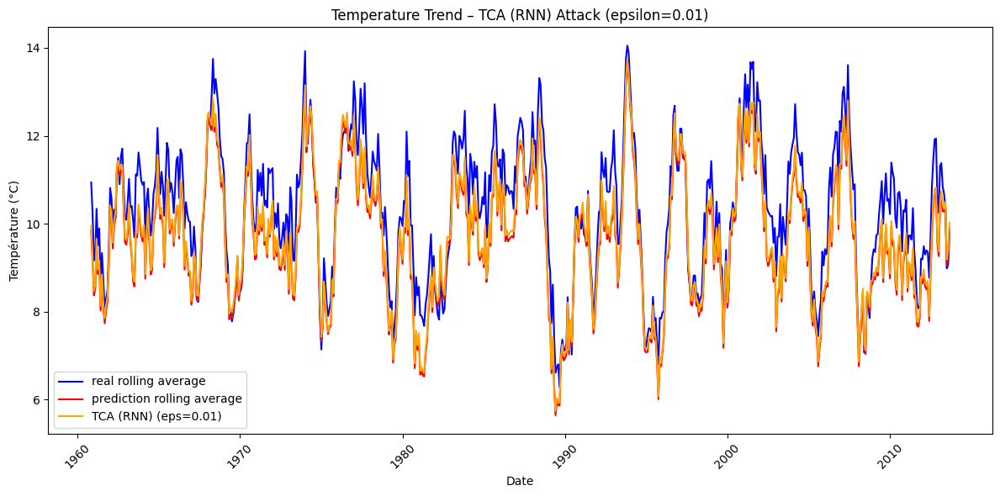

RNN | TCA – Epsilon 0.1 – Adversarial MAE: 1.6237 | SIM: 0.9873


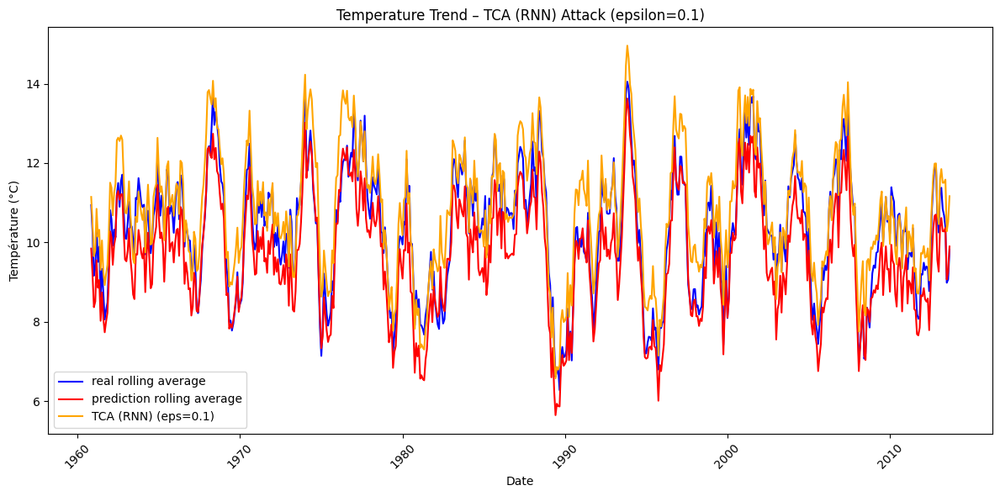

RNN | TCA – Epsilon 0.2 – Adversarial MAE: 2.4915 | SIM: 0.9849


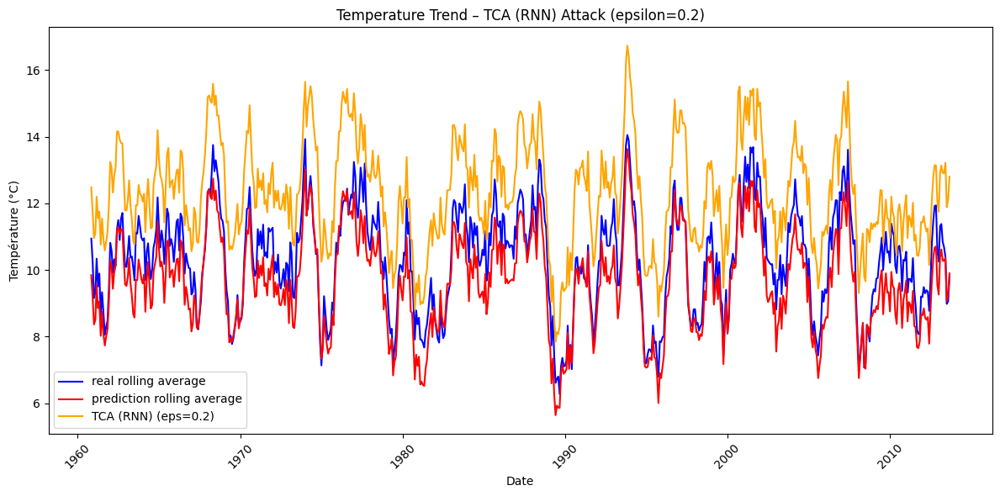

In [ ]:
# FGSM
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model_temp_RNN, 'RNN', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


## CNN PART

In [ ]:
class SimpleCNN(nn.Module):
    def __init__(self, input_channels, output_size):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv1d(in_channels=input_channels, out_channels=32, kernel_size=3)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3)
        self.relu2 = nn.ReLU()
        self.pool = nn.AdaptiveAvgPool1d(1)
        self.fc = nn.Linear(64, output_size)

    def forward(self, x):
        # Input shape: (batch_size, sequence_length, features) need to change to
        # PyTorch Conv1d: (batch_size, features, sequence_length)
        x = x.permute(0, 2, 1)  # Reorder to (batch_size, features, sequence_length)

        x = self.relu1(self.conv1(x))  # Apply first conv + ReLU
        x = self.relu2(self.conv2(x))  # Apply second conv + ReLU
        x = self.pool(x)               # Shape becomes (batch_size, 64, 1)

        x = x.view(x.size(0), -1)      # Flatten to (batch_size, 64)
        return self.fc(x)              # Final output: (batch_size, output_size)

In [ ]:
model_temp_CNN = SimpleCNN(input_channels=1, output_size=1)
loss_fn = nn.MSELoss() #loss function
optimizer = torch.optim.Adam(model_temp_CNN.parameters(), lr=0.001) #optimize (adam)
num_epochs = 10
train_model(model_temp_CNN,loss_fn,optimizer,num_epochs)

Epoch 1/10, Loss: 0.0542
Epoch 2/10, Loss: 0.0185
Epoch 3/10, Loss: 0.0130
Epoch 4/10, Loss: 0.0120
Epoch 5/10, Loss: 0.0111
Epoch 6/10, Loss: 0.0105
Epoch 7/10, Loss: 0.0102
Epoch 8/10, Loss: 0.0092
Epoch 9/10, Loss: 0.0086
Epoch 10/10, Loss: 0.0082


In [ ]:
model_temp_CNN.eval()
with torch.no_grad():
    predictions = [] #store predictions
    true_values = [] #store the true value y
    test_indices = []  # Store indices for test data
    for i, (X_test, Y_test) in enumerate(test_loader):
        output = model_temp_CNN(X_test)
        predictions.append(output.numpy())
        true_values.append(Y_test.numpy())
        # Store indices for the current batch
        batch_size = X_test.shape[0]
        start_idx = train_size + i * 32
        end_idx = min(start_idx + batch_size, len(dates))
        test_indices.extend(range(start_idx, end_idx))

    predictions = np.concatenate(predictions, axis=0).squeeze()
    true_values = np.concatenate(true_values, axis=0).squeeze()
    test_dates = [dates[i] for i in test_indices]  # Align dates with test data

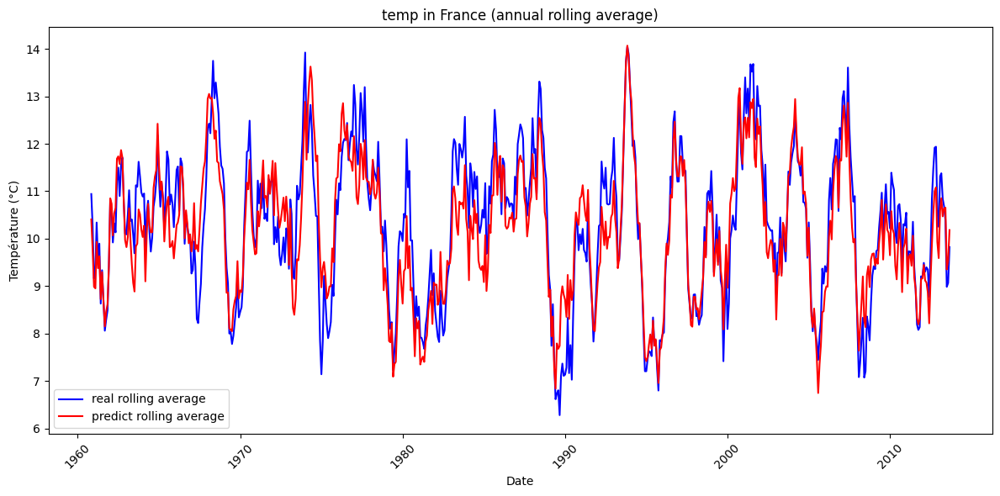

In [ ]:
temps_min = france_monthly['AverageTemperature'].min()
temps_max = france_monthly['AverageTemperature'].max()

true_values_denorm = true_values * (temps_max - temps_min) + temps_min
predictions_denorm = predictions * (temps_max - temps_min) + temps_min

true_values_denorm_month = pd.Series(true_values_denorm).rolling(window=12).mean()
predictions_denorm_month = pd.Series(predictions_denorm).rolling(window=12).mean()

mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

res_tab_temp.loc[('CNN', 'MAE'), ('NA', '0.00')] = mae
res_tab_temp.loc[('CNN', 'SIM'), ('NA', '0.00')] = sim
res_tab_temp.loc[('CNN', 'RSME'), ('NA', '0.00')] = rsme

# plot on month average temp in france (more easy to see the result)
plt.figure(figsize=(12, 6))
plt.plot(test_dates, true_values_denorm_month, label='real rolling average', color='blue')
plt.plot(test_dates, predictions_denorm_month, label='predict rolling average', color='red')
plt.xlabel('Date')
plt.ylabel('Température (°C)')
plt.title('temp in France (annual rolling average)')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

CNN | FGSM – Epsilon 0.01 – Adversarial MAE: 2.1990 | SIM: 0.9723


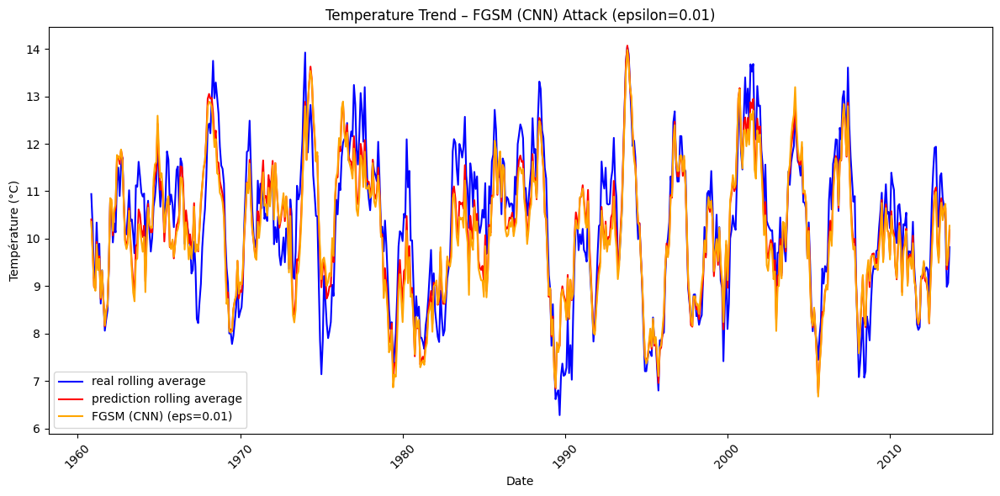

CNN | FGSM – Epsilon 0.1 – Adversarial MAE: 6.3591 | SIM: 0.8389


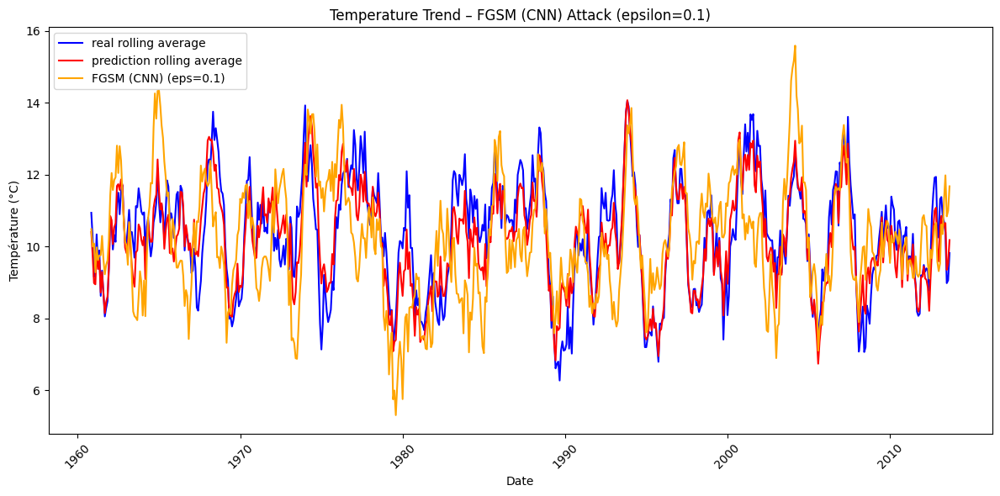

CNN | FGSM – Epsilon 0.2 – Adversarial MAE: 10.0257 | SIM: 0.6629


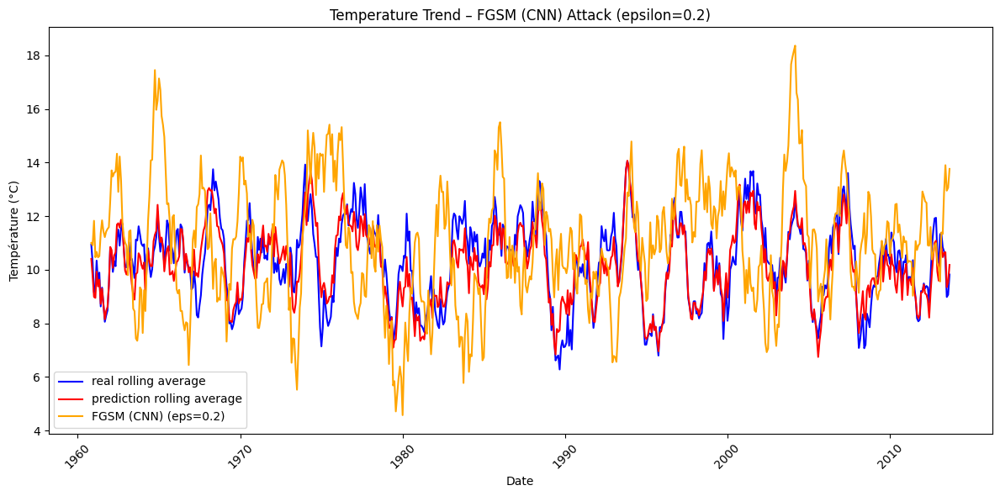

CNN | BIM – Epsilon 0.01 – Adversarial MAE: 2.1989 | SIM: 0.9723


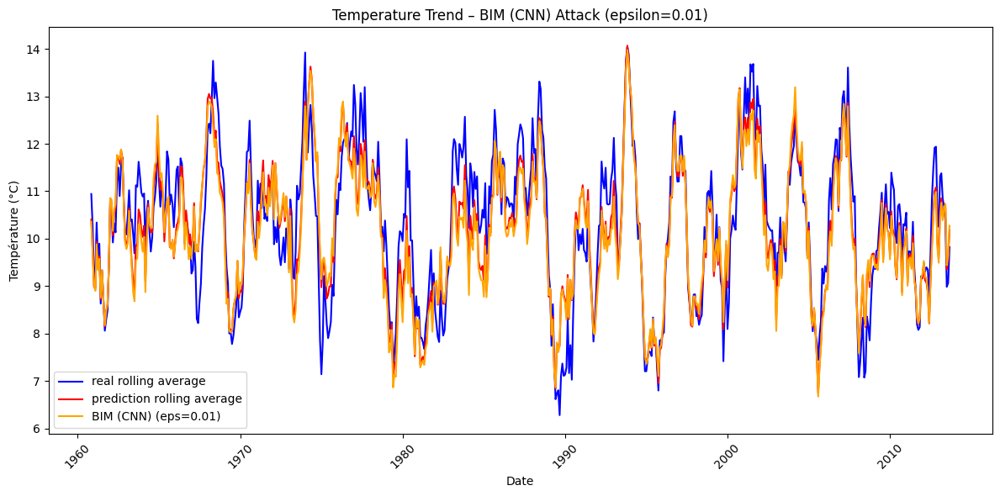

CNN | BIM – Epsilon 0.1 – Adversarial MAE: 6.5933 | SIM: 0.8299


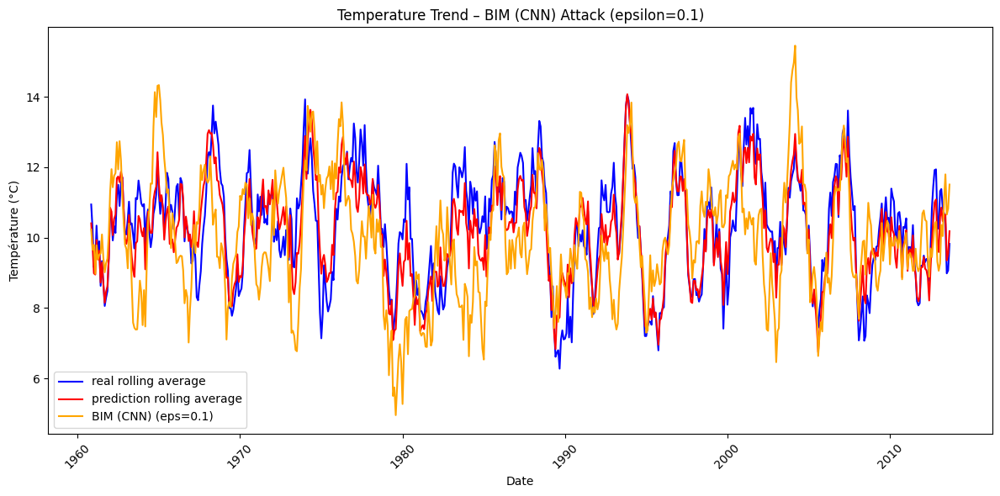

CNN | BIM – Epsilon 0.2 – Adversarial MAE: 10.8282 | SIM: 0.6218


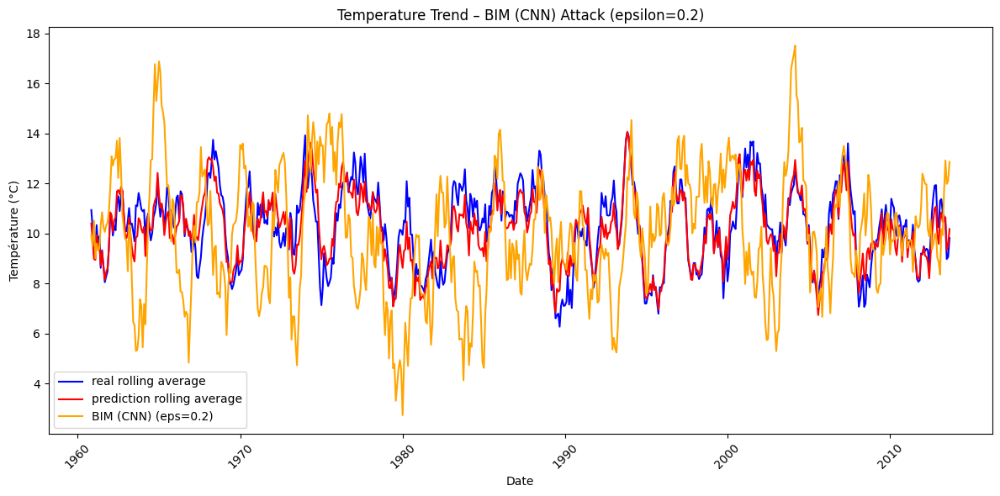

CNN | TCA – Epsilon 0.01 – Adversarial MAE: 1.7658 | SIM: 0.9792


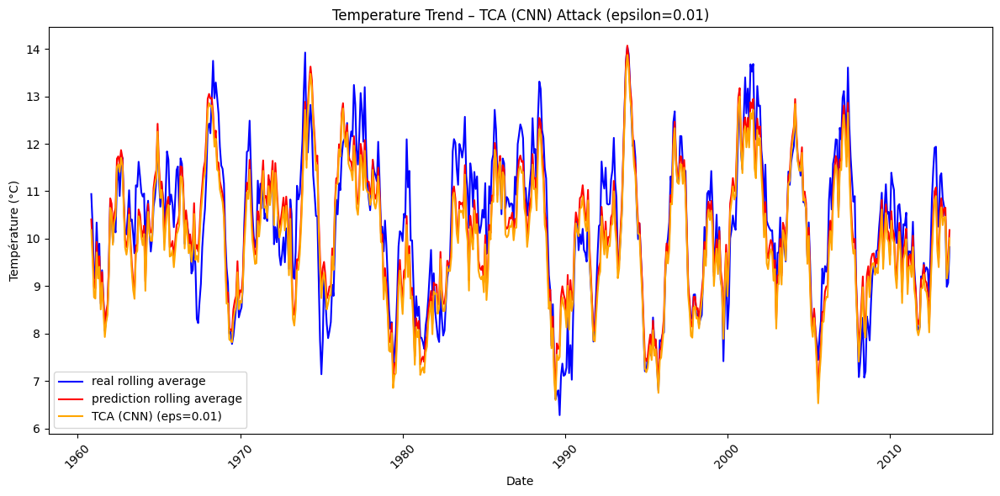

CNN | TCA – Epsilon 0.1 – Adversarial MAE: 2.9763 | SIM: 0.9706


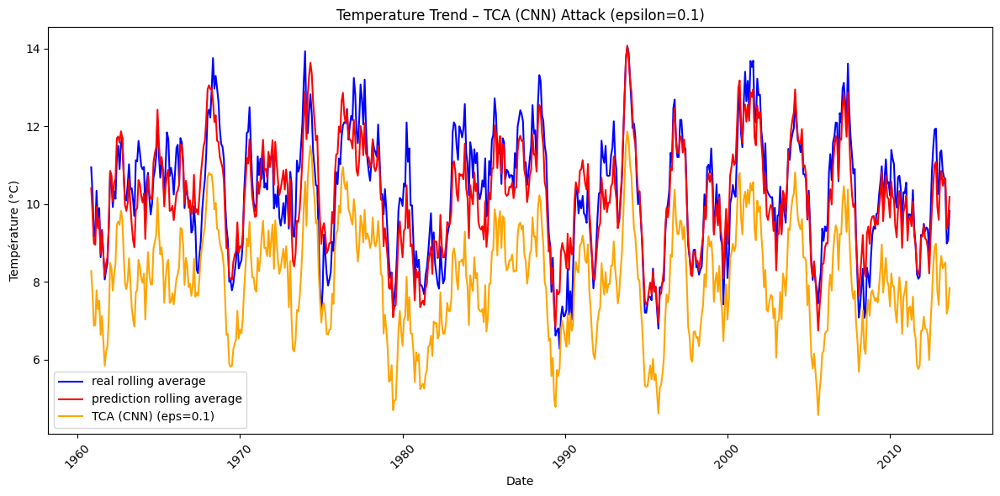

CNN | TCA – Epsilon 0.2 – Adversarial MAE: 4.7458 | SIM: 0.9485


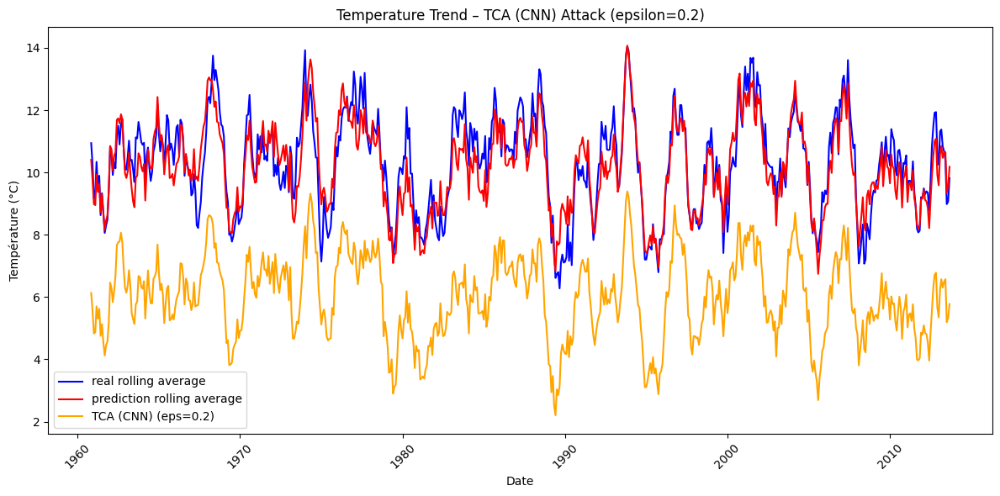

In [ ]:
# FGSM
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, fgsm_attack, "FGSM",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp
)

# BIM
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, bim_attack, "BIM",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)

# TCA
run_and_log_attack(
    model_temp_CNN, 'CNN', loss_fn, test_loader, tca_attack, "TCA",
    epsilon_values, temps_min, temps_max, predictions, test_dates, res_tab_temp,
    alpha=alpha, num_iter=iters
)


In [ ]:
display(res_tab_temp)

Attack              NA      FGSM                            BIM            \
ε                 0.00      0.01      0.10       0.20      0.01      0.10   
Model Metric                                                                
LSTM  MAE     1.328220  1.667338  4.633690   7.610150  1.667093  4.648417   
      RSME    1.687789  1.962986  4.796259   7.845135  1.962711  4.809606   
      SIM     0.990045  0.986450  0.917165   0.793785  0.986454  0.916741   
RNN   MAE     1.388660  1.704012  4.558694   7.633389  1.703875  4.564262   
      RSME    1.744487  2.004849  4.697997   7.768689  2.004741  4.703043   
      SIM     0.990653  0.987540  0.920473   0.763848  0.987542  0.920275   
CNN   MAE     1.694888  2.198978  6.359127  10.025741  2.198884  6.593281   
      RSME    2.409573  2.792291  6.738390  10.771466  2.792120  6.907308   
      SIM     0.979487  0.972273  0.838875   0.662864  0.972277  0.829905   

Attack                        TCA                      
ε                  0.20      0.01      0.10      0.20  
Model Metric                                           
LSTM  MAE      7.624132  1.350730  1.743370  2.779427  
      RSME     7.860328  1.705726  2.099425  3.167009  
      SIM      0.792522  0.989717  0.986943  0.984135  
RNN   MAE      7.601957  1.372323  1.623659  2.491468  
      RSME     7.746000  1.722615  1.967999  2.858567  
      SIM      0.764954  0.990463  0.987348  0.984918  
CNN   MAE     10.828151  1.765801  2.976275  4.745839  
      RSME    11.217389  2.448690  3.501861  5.186780  
      SIM      0.621828  0.979152  0.970606  0.948508

The fact that there is a translation is good, because it implies that I satisfied the three main components mentioned in the paper:

*    Effectiveness

*    Stealthiness

*    Rationality


## Analysis and Question

* Something really strange is that both attacks (FGSM/BIM) have the same MAE/RSME value.
Does this imply that, under certain conditions, a BIM attack behaves just like an FGSM attack, since BIM is essentially multiple iterations of FGSM? I see on the paper (https://www.sciencedirect.com/science/article/abs/pii/S0957417424028173) that BIM get lot more MAE/RSME than FGSM so maybe the implementation of BIM is not good ?

* In a non-targeted TCA adversarial attack on stock data, why does the perturbation mainly manifest as a uniform upward shift (translation upwards)? Intuitively, since the attack’s goal is to just maximize the model’s loss without targeting a specific output, I would expect the perturbation to sometimes push predictions downwards or create more varied fluctuations. Why does the perturbation tend to be an increase rather than a decrease or a mix? I think maybe i get a miss understand of how TCA really work? After implementing CNN, it clear that i dont know why but now the translation is down shift??? So maybe I need one more time to look at the TCA attack to be sure that nothing is wrong in my implementation.

# SAME BUT WITH GOOGLE STOCK DATA

## LSMT PART

In [ ]:
google_data = pd.read_csv("HistoricalData_1747091015337.csv")
google_data['Date'] = pd.to_datetime(google_data['Date'])
google_data = google_data.sort_values(by='Date')
print(google_data)
print(google_data['Close/Last'].max())

           Date Close/Last    Volume      Open      High        Low
1254 2020-05-13   $67.4665  36251700  $68.8525  $69.2741     $66.42
1253 2020-05-14   $67.8065  32061540   $66.751   $67.871   $66.1955
1252 2020-05-15   $68.6595  34154940    $67.50   $68.724     $66.95
1251 2020-05-18    $69.197  36479280  $68.0875  $69.6163   $67.7125
1250 2020-05-19   $68.6743  25612980  $69.3499    $69.60   $68.6743
...         ...        ...       ...       ...       ...        ...
4    2025-05-05    $166.05  15309340  $164.515   $167.10    $164.47
3    2025-05-06    $165.20  10691950   $163.96   $166.74    $163.13
2    2025-05-07    $152.80  78900430   $166.07   $166.99  $149.4901
1    2025-05-08    $155.75  38387510   $155.92   $157.41    $154.10
0    2025-05-09    $154.38  22871040   $155.55   $156.43    $153.83

[1255 rows x 6 columns]
$99.87


In [ ]:
for col in ['Close/Last', 'Open', 'High', 'Low']:
    google_data[col] = google_data[col].replace('[\$,]', '', regex=True).astype(float)

features = ['Close/Last', 'Open', 'High', 'Low', 'Volume']

# Calcul des min et max AVANT normalisation
price_min = google_data['Close/Last'].min()
price_max = google_data['Close/Last'].max()
open_min = google_data['Open'].min()
open_max = google_data['Open'].max()
high_min = google_data['High'].min()
high_max = google_data['High'].max()
low_min = google_data['Low'].min()
low_max = google_data['Low'].max()
volume_min = google_data['Volume'].min()
volume_max = google_data['Volume'].max()

# Normalisation cohérente
google_data['Close/Last'] = (google_data['Close/Last'] - price_min) / (price_max - price_min)
google_data['Open'] = (google_data['Open'] - open_min) / (open_max - open_min)
google_data['High'] = (google_data['High'] - high_min) / (high_max - high_min)
google_data['Low'] = (google_data['Low'] - low_min) / (low_max - low_min)
google_data['Volume'] = (google_data['Volume'] - volume_min) / (volume_max - volume_min)


data = google_data[features].values.astype(np.float32)

sequence_length = 30  # 30 days
X, Y, dates = [], [], []

for i in range(len(data) - sequence_length):
    X.append(data[i:i+sequence_length])
    Y.append(data[i+sequence_length][0])
    dates.append(google_data['Date'].iloc[i + sequence_length])

X = torch.tensor(X)  # (N, 30, 5)
Y = torch.tensor(Y).unsqueeze(-1)  # (N, 1)

print(X.shape)
print(Y.shape)

# 70% train, 15% val, 15% test
# for the moment the val set is something that i not understand at 100% i think
# I use it in the wrong way?
dataset = TensorDataset(X, Y)
total_size = len(dataset)
train_size = int(total_size * 0.7)
val_size = int(total_size * 0.15)
test_size = total_size - train_size - val_size

train_set, val_set, test_set = random_split(dataset, [train_size, val_size, test_size])

train_loader = DataLoader(train_set, batch_size=32, shuffle=True)
val_loader = DataLoader(val_set, batch_size=32)
test_loader = DataLoader(test_set, batch_size=32)

torch.Size([1225, 30, 5])
torch.Size([1225, 1])


In [ ]:
def train_model_with_validation(model, loss_fn, optimizer, num_epochs, train_loader, val_loader,sequence_length):
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        avg_train_loss = running_loss / len(train_loader)

        model.eval()
        val_loss = 0.0
        with torch.no_grad():
            for i, (inputs, labels) in enumerate(val_loader):
                outputs = model(inputs)
                loss = loss_fn(outputs, labels)
                val_loss += loss.item()

        avg_val_loss = val_loss / len(val_loader)

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

In [ ]:
model_google = SimpleLSTM(input_size=5, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google, loss_fn, optimizer, num_epochs, train_loader, val_loader,sequence_length)

Epoch [1/10], Train Loss: 0.1024, Validation Loss: 0.0083
Epoch [2/10], Train Loss: 0.0057, Validation Loss: 0.0014
Epoch [3/10], Train Loss: 0.0021, Validation Loss: 0.0009
Epoch [4/10], Train Loss: 0.0012, Validation Loss: 0.0007
Epoch [5/10], Train Loss: 0.0012, Validation Loss: 0.0009
Epoch [6/10], Train Loss: 0.0010, Validation Loss: 0.0006
Epoch [7/10], Train Loss: 0.0011, Validation Loss: 0.0008
Epoch [8/10], Train Loss: 0.0009, Validation Loss: 0.0006
Epoch [9/10], Train Loss: 0.0010, Validation Loss: 0.0006
Epoch [10/10], Train Loss: 0.0010, Validation Loss: 0.0011


In [ ]:
model_google.eval()
with torch.no_grad():
    real_values = []
    predicted_values = []
    test_indices = []
    for i, (inputs, labels) in enumerate(test_loader):
        outputs = model_google(inputs)
        real_values.append(labels.cpu().numpy())
        predicted_values.append(outputs.cpu().numpy())


        batch_size = inputs.shape[0]
        start_idx = train_size + val_size + i * test_loader.batch_size
        end_idx = min(start_idx + batch_size, len(dates))
        test_indices.extend(range(start_idx, end_idx))

real_values = np.concatenate(real_values).squeeze()
predicted_values = np.concatenate(predicted_values).squeeze()
test_dates = [dates[i] for i in test_indices]

In [ ]:
# Creation of the tab result for plotting adversial attack result
models = ['LSTM','RNN']
metrics = ['MAE', "RSME", 'SIM']

row_index = pd.MultiIndex.from_product([models, metrics], names=['Model', 'Metric'])

attacks = ['NA', 'FGSM', 'BIM', 'TCA']
epsilons = {
    'NA': [0],
    'FGSM': [0.01, 0.1, 0.2],
    'BIM': [0.01, 0.1, 0.2],
    'TCA': [0.01, 0.1, 0.2],
}

col_tuples = []
for atk, eps_list in epsilons.items():
    for eps in eps_list:
        col_tuples.append((atk, f"{eps:.2f}"))

col_index = pd.MultiIndex.from_tuples(col_tuples, names=['Attack', 'ε'])

res_tab = pd.DataFrame(index=row_index, columns=col_index, dtype=float)

print(res_tab)

Attack         NA FGSM            BIM            TCA          
ε            0.00 0.01 0.10 0.20 0.01 0.10 0.20 0.01 0.10 0.20
Model Metric                                                  
LSTM  MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
RNN   MAE     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      RSME    NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN
      SIM     NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN


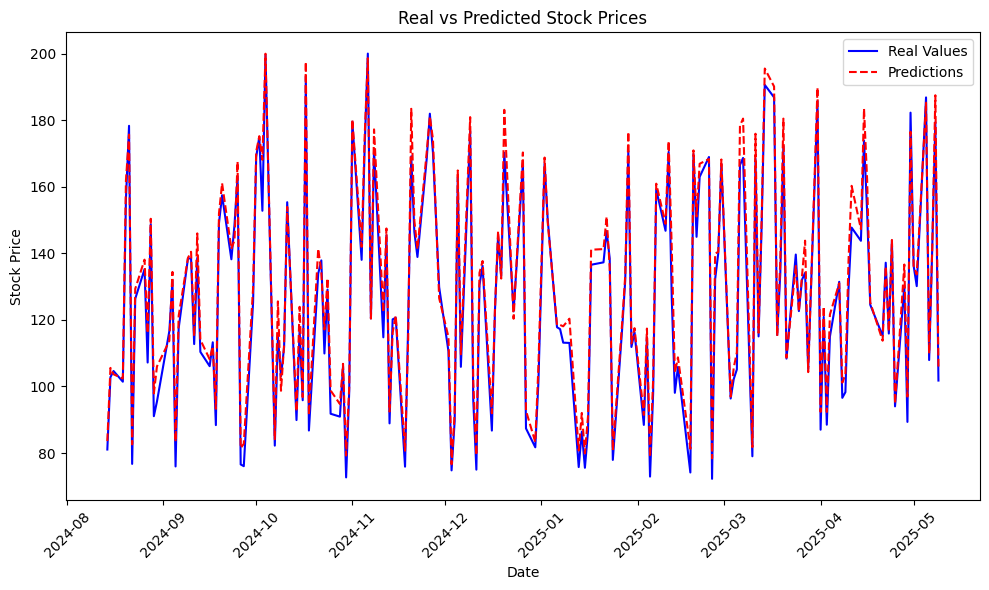

In [ ]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_values_denorm, predictions_denorm))

res_tab.loc[('LSTM', 'MAE'), ('NA', '0.00')] = mae
res_tab.loc[('LSTM', 'SIM'), ('NA', '0.00')] = sim
res_tab.loc[('LSTM', 'RSME'), ('NA', '0.00')] = rsme

plt.figure(figsize=(10,6))
plt.plot(test_dates, true_values_denorm, label='Real Values', color='blue')
plt.plot(test_dates, predictions_denorm, label='Predictions', color='red', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.title('Real vs Predicted Stock Prices')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
def plot_rolling_attacks_google(test_dates, true_vals, pred_vals, adv_vals, label, eps):
    true_smooth = pd.Series(true_vals).rolling(window=12).mean()
    pred_smooth = pd.Series(pred_vals).rolling(window=12).mean()
    adv_smooth = pd.Series(adv_vals).rolling(window=12).mean()

    plt.figure(figsize=(12, 6))
    plt.plot(test_dates, true_smooth, label='real rolling average', color='blue')
    plt.plot(test_dates, pred_smooth, label='prediction rolling average', color='red')
    plt.plot(test_dates, adv_smooth, label=f'{label} (eps={eps})', color='orange')

    plt.xlabel('Date')
    plt.ylabel('stock price')
    plt.title(f'stock price – {label} Attack (epsilon={eps})')
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

FGSM – Epsilon 0.01 – Adversarial MAE: 5.3025 | SIM: 0.9994


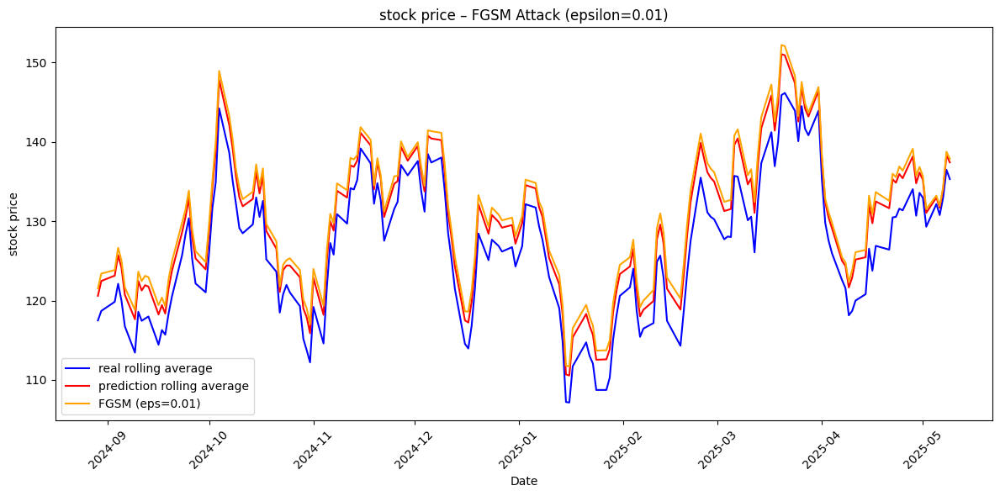

FGSM – Epsilon 0.1 – Adversarial MAE: 17.9157 | SIM: 0.9953


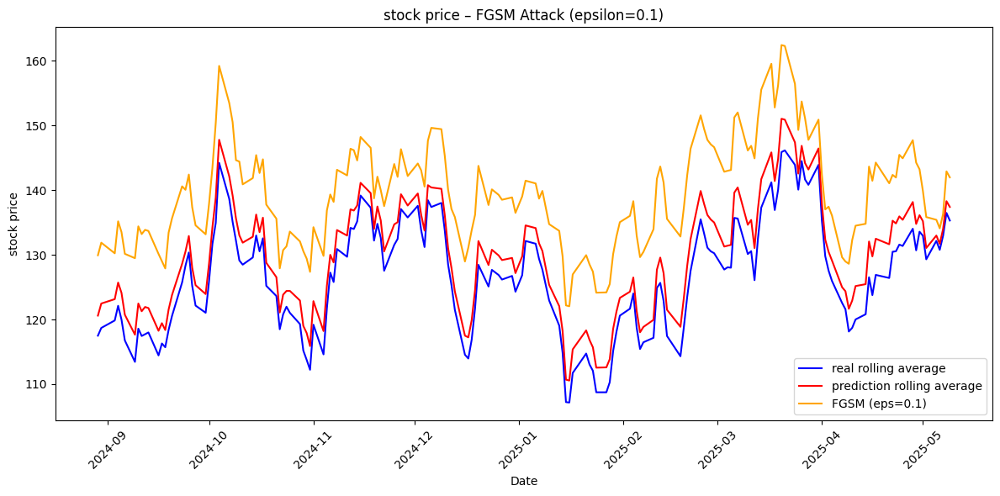

FGSM – Epsilon 0.2 – Adversarial MAE: 31.8444 | SIM: 0.9870


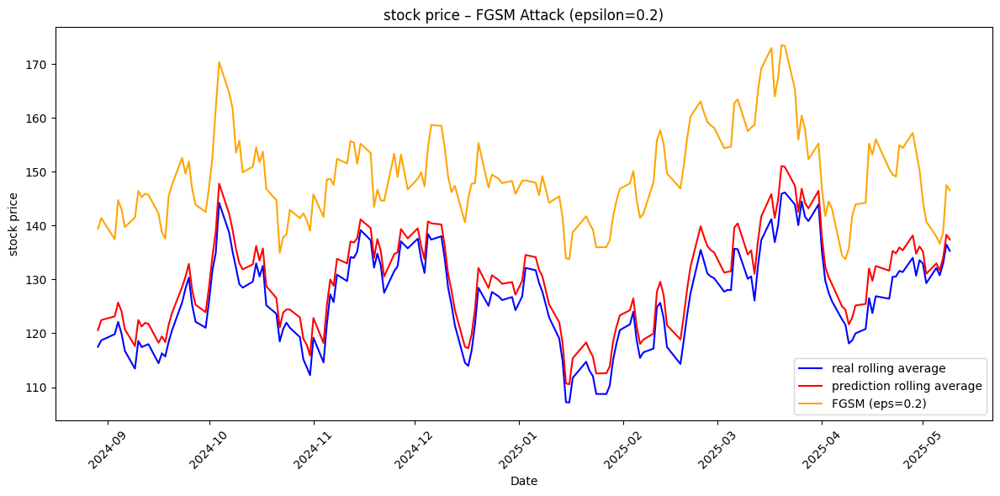

BIM – Epsilon 0.01 – Adversarial MAE: 5.3024 | SIM: 0.9994


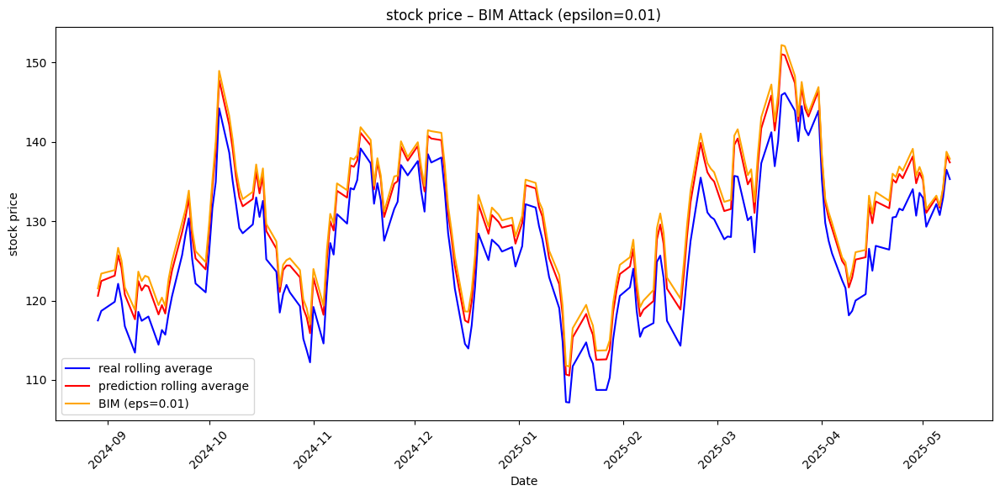

BIM – Epsilon 0.1 – Adversarial MAE: 17.8575 | SIM: 0.9953


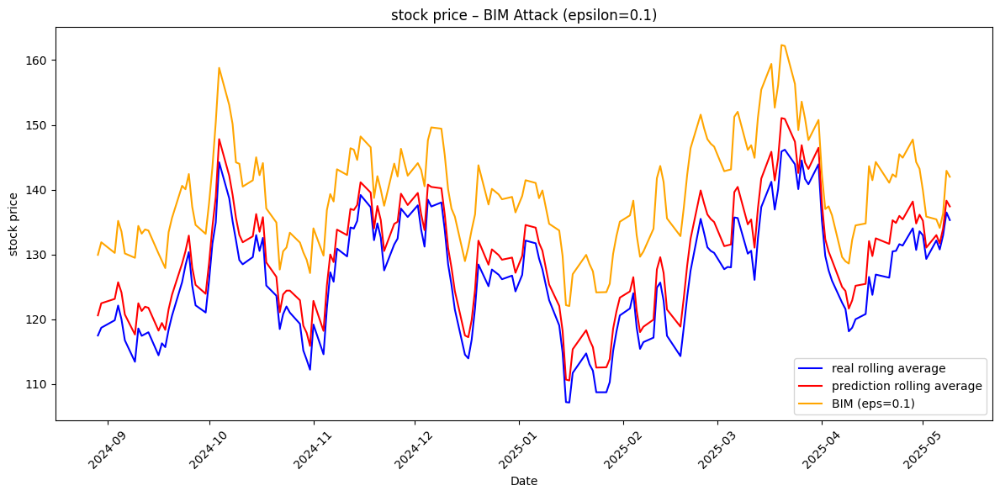

BIM – Epsilon 0.2 – Adversarial MAE: 31.3517 | SIM: 0.9869


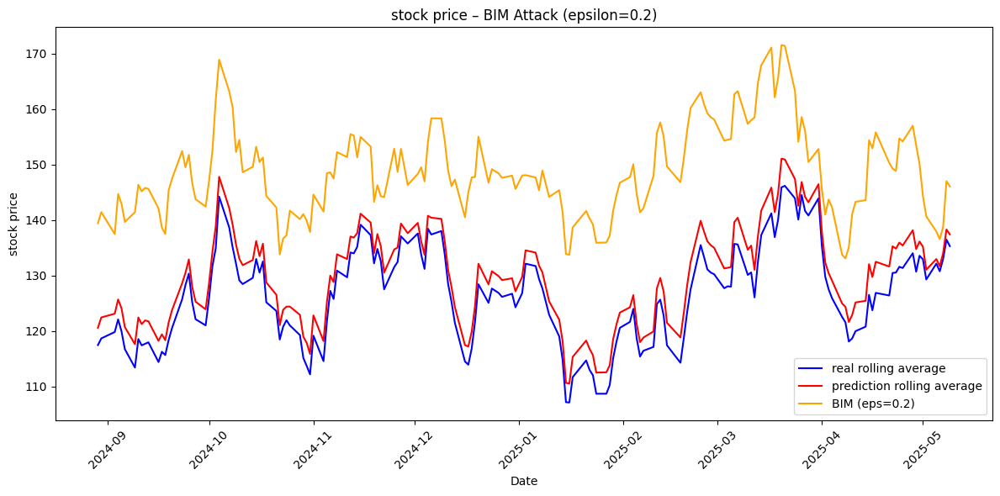

In [ ]:
# just some test of adersial attack on google stock data set
# not the result on the result tab

epsilon_values = [0.01, 0.1, 0.2]
alpha = 0.01
iters = 40

# FGSM
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, fgsm_attack, epsilon=eps)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"FGSM – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="FGSM", eps=eps)

# BIM
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, bim_attack, epsilon=eps, alpha=alpha, num_iter=iters)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"BIM – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="BIM", eps=eps)

TCA – Epsilon 0.01 – Adversarial MAE: 4.9254 | SIM: 0.9996


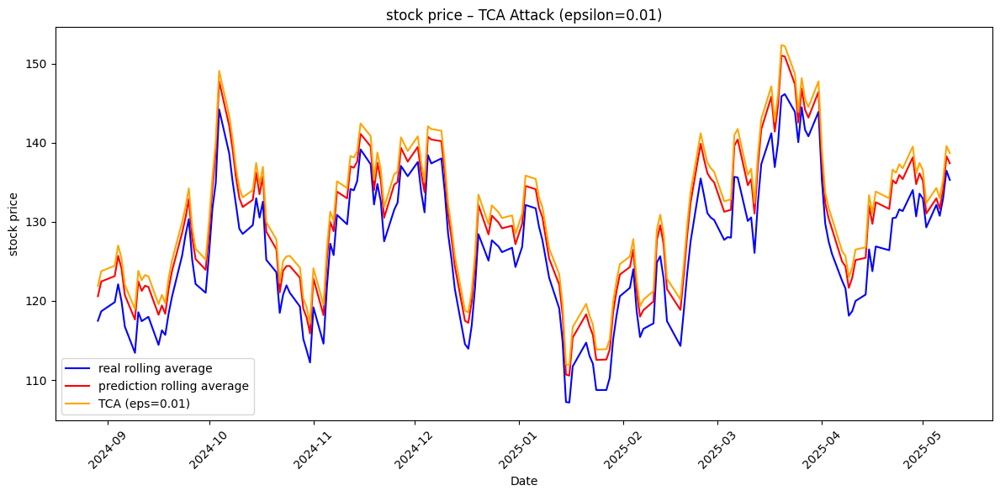

TCA – Epsilon 0.1 – Adversarial MAE: 16.6293 | SIM: 0.9993


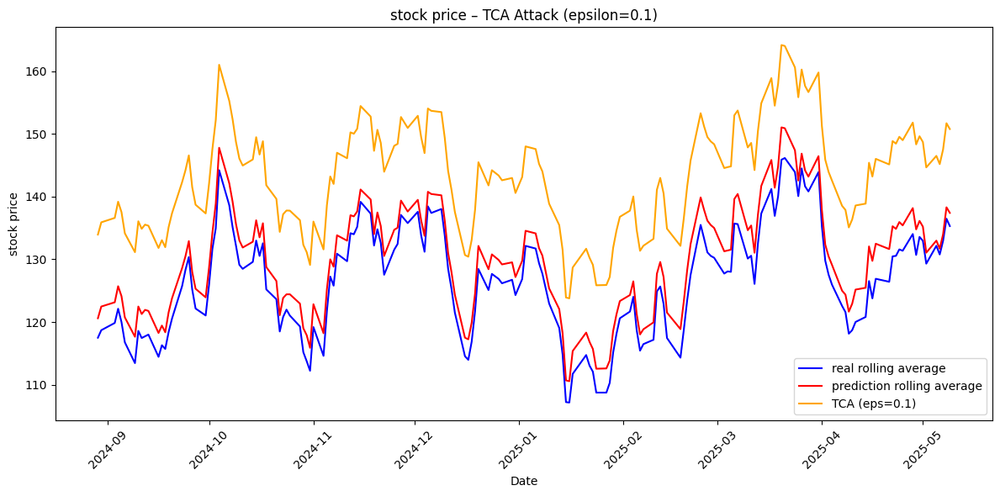

TCA – Epsilon 0.2 – Adversarial MAE: 29.9887 | SIM: 0.9985


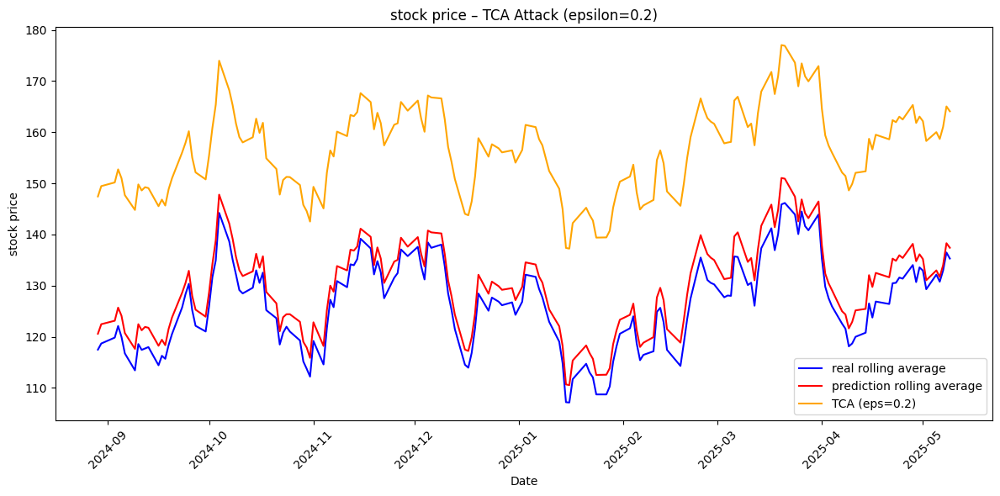

In [ ]:
# TCA
epsilon_values = [0.01, 0.1, 0.2]
for eps in epsilon_values:
    adv_preds, true_vals = run_attack(model_google, loss_fn, test_loader, tca_attack, epsilon=eps)
    adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
    true_vals_denorm = denormalize(true_vals, price_min, price_max)

    mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
    sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
    print(f"TCA – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")

    plot_rolling_attacks_google(test_dates, true_vals_denorm, predictions_denorm, adv_preds_denorm, label="TCA", eps=eps)

FGSM – Epsilon 0.01 – Adversarial MAE: 5.3025 | SIM: 0.9994
BIM – Epsilon 0.01 – Adversarial MAE: 5.3024 | SIM: 0.9994
TCA – Epsilon 0.01 – Adversarial MAE: 4.9254 | SIM: 0.9996


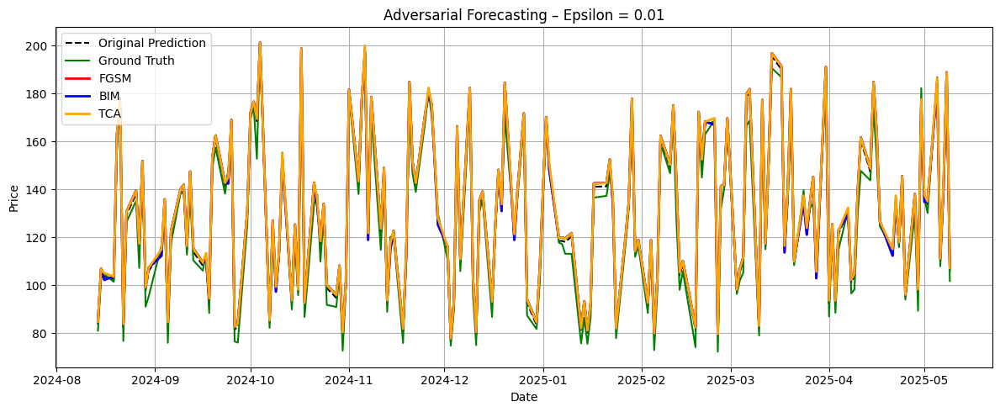

FGSM – Epsilon 0.1 – Adversarial MAE: 17.9157 | SIM: 0.9953
BIM – Epsilon 0.1 – Adversarial MAE: 17.8562 | SIM: 0.9953
TCA – Epsilon 0.1 – Adversarial MAE: 16.6293 | SIM: 0.9993


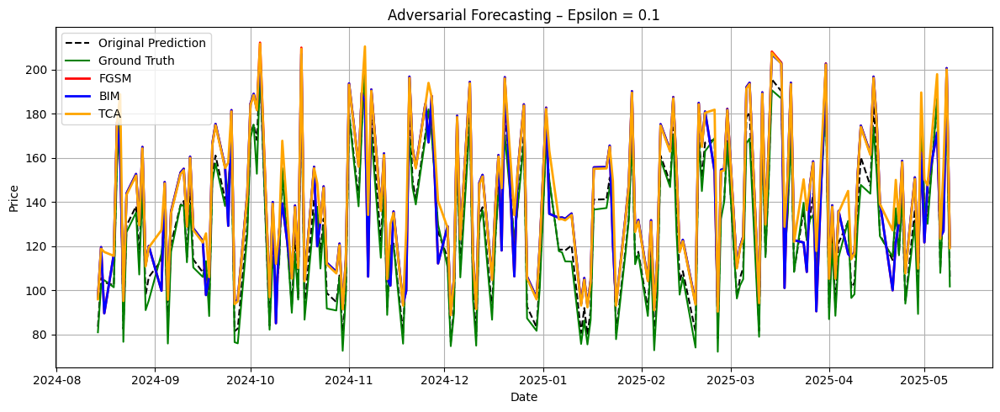

FGSM – Epsilon 0.2 – Adversarial MAE: 31.8444 | SIM: 0.9870
BIM – Epsilon 0.2 – Adversarial MAE: 31.3515 | SIM: 0.9869
TCA – Epsilon 0.2 – Adversarial MAE: 29.9887 | SIM: 0.9985


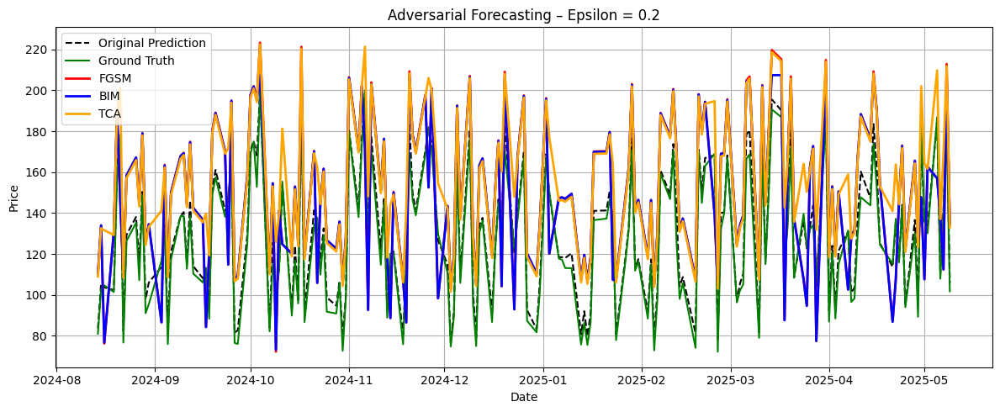

In [ ]:
# make adversial attack on google stock dataset -> store the result on res tab
# and plot all the prediction on the same plt.
# that is gonna be the same process for the 3 AI model (LSMT/RNN/CNN)

epsilon_values = [0.01, 0.1, 0.2]

# Couleurs personnalisées
colors = {
    "FGSM": "red",
    "BIM": "blue",
    "TCA": "orange"
}

for eps in epsilon_values:
    alpha = eps / 10
    iters = 10 if eps < 0.2 else 20

    methods = {
        "FGSM": lambda eps: run_attack(model_google, loss_fn, test_loader, fgsm_attack, epsilon=eps),
        "BIM":  lambda eps: run_attack(model_google, loss_fn, test_loader, bim_attack, epsilon=eps, alpha=alpha, num_iter=iters),
        "TCA":  lambda eps: run_attack(model_google, loss_fn, test_loader, tca_attack, epsilon=eps),
    }

    plt.figure(figsize=(12, 5))
    plt.title(f"Adversarial Forecasting – Epsilon = {eps}")

    true_vals_plot = None
    pred_vals_plot = predictions_denorm
    plt.plot(test_dates, pred_vals_plot, label="Original Prediction", linestyle="--", color="black")

    for method_name, attack_fn in methods.items():
        adv_preds, true_vals = attack_fn(eps)
        adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
        true_vals_denorm = denormalize(true_vals, price_min, price_max)

        if true_vals_plot is None:
            true_vals_plot = true_vals_denorm
            plt.plot(test_dates, true_vals_plot, label="Ground Truth", color="green")

        mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
        sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
        rsme = np.sqrt(mean_squared_error(true_vals_denorm, adv_preds_denorm))
        print(f"{method_name} – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")
        res_tab.loc[('LSTM', 'MAE'), (method_name, f"{eps:.2f}")] = mae
        res_tab.loc[('LSTM', 'SIM'), (method_name, f"{eps:.2f}")] = sim
        res_tab.loc[('LSTM', 'RSME'), (method_name, f"{eps:.2f}")] = rsme
        plt.plot(test_dates, adv_preds_denorm, label=method_name, linewidth=2, color=colors[method_name])

    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## RNN PART

In [ ]:
model_google_RNN = SimpleRNN(input_size=5, hidden_size=64, output_size=1, num_layers=2)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google_RNN.parameters(), lr=0.01)
num_epochs = 10
train_model_with_validation(model_google_RNN, loss_fn, optimizer, num_epochs, train_loader, val_loader,sequence_length)

Epoch [1/10], Train Loss: 0.1145, Validation Loss: 0.6393
Epoch [2/10], Train Loss: 0.1635, Validation Loss: 0.0502
Epoch [3/10], Train Loss: 0.0352, Validation Loss: 0.0150
Epoch [4/10], Train Loss: 0.0519, Validation Loss: 0.0027
Epoch [5/10], Train Loss: 0.0023, Validation Loss: 0.0026
Epoch [6/10], Train Loss: 0.0019, Validation Loss: 0.0010
Epoch [7/10], Train Loss: 0.0018, Validation Loss: 0.0029
Epoch [8/10], Train Loss: 0.0018, Validation Loss: 0.0008
Epoch [9/10], Train Loss: 0.0009, Validation Loss: 0.0009
Epoch [10/10], Train Loss: 0.0013, Validation Loss: 0.0007


In [ ]:
model_google_RNN.eval()
with torch.no_grad():
    real_values = []
    predicted_values = []
    test_indices = []
    for i, (inputs, labels) in enumerate(test_loader):
        outputs = model_google_RNN(inputs)
        real_values.append(labels.cpu().numpy())
        predicted_values.append(outputs.cpu().numpy())


        batch_size = inputs.shape[0]
        start_idx = train_size + val_size + i * test_loader.batch_size
        end_idx = min(start_idx + batch_size, len(dates))
        test_indices.extend(range(start_idx, end_idx))

real_values = np.concatenate(real_values).squeeze()
predicted_values = np.concatenate(predicted_values).squeeze()
test_dates = [dates[i] for i in test_indices]

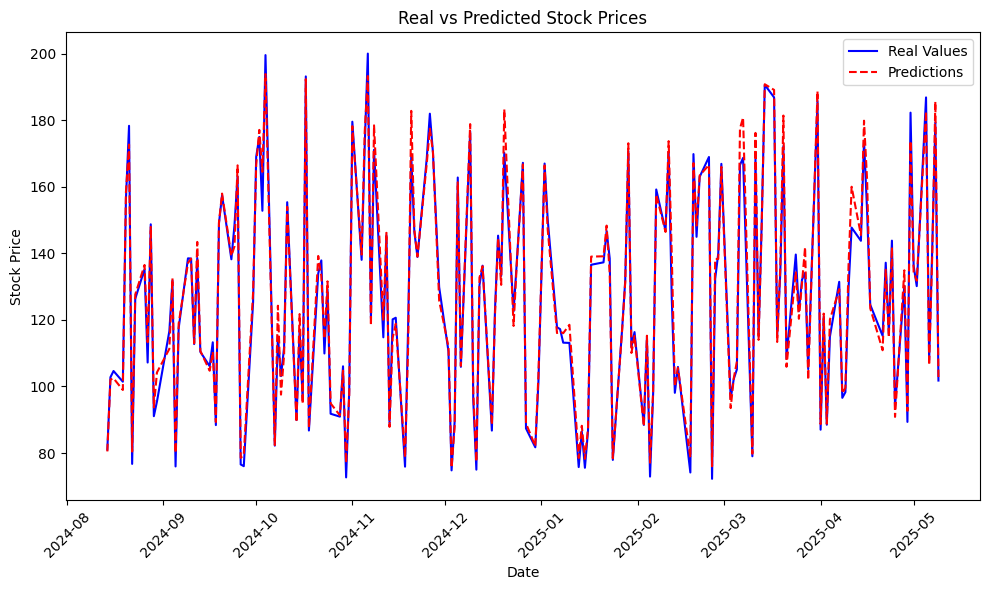

In [ ]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_vals_denorm, predictions_denorm))

res_tab.loc[('RNN', 'MAE'), ('NA', '0.00')] = mae
res_tab.loc[('RNN', 'SIM'), ('NA', '0.00')] = sim
res_tab.loc[('RNN', 'RSME'), ('NA', '0.00')] = rsme

plt.figure(figsize=(10,6))
plt.plot(test_dates, true_values_denorm, label='Real Values', color='blue')
plt.plot(test_dates, predictions_denorm, label='Predictions', color='red', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.title('Real vs Predicted Stock Prices')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

FGSM – Epsilon 0.01 – Adversarial MAE: 4.2928 | SIM: 0.9993
BIM – Epsilon 0.01 – Adversarial MAE: 4.2924 | SIM: 0.9993
TCA – Epsilon 0.01 – Adversarial MAE: 3.3348 | SIM: 0.9995


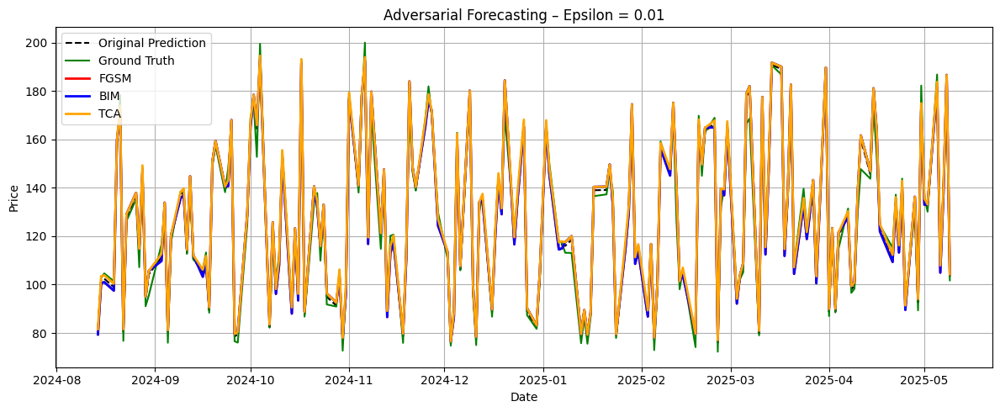

FGSM – Epsilon 0.1 – Adversarial MAE: 16.5282 | SIM: 0.9921
BIM – Epsilon 0.1 – Adversarial MAE: 16.5131 | SIM: 0.9921
TCA – Epsilon 0.1 – Adversarial MAE: 14.3609 | SIM: 0.9992


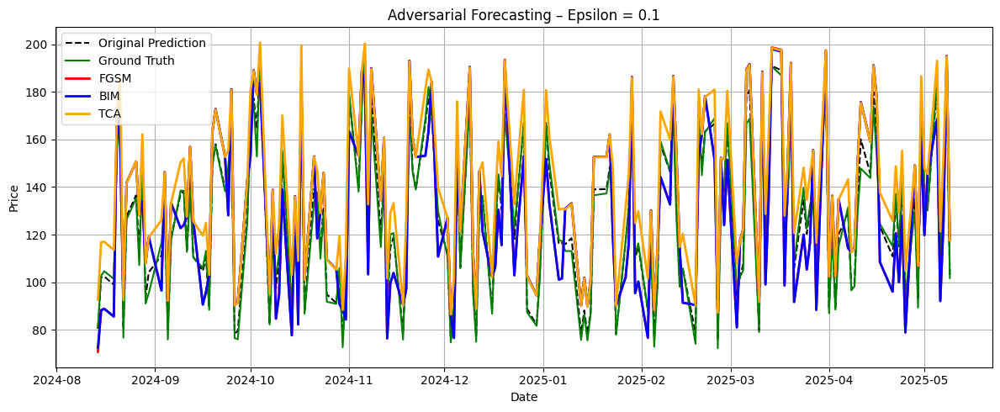

FGSM – Epsilon 0.2 – Adversarial MAE: 29.9554 | SIM: 0.9742
BIM – Epsilon 0.2 – Adversarial MAE: 29.4042 | SIM: 0.9760
TCA – Epsilon 0.2 – Adversarial MAE: 27.5036 | SIM: 0.9979


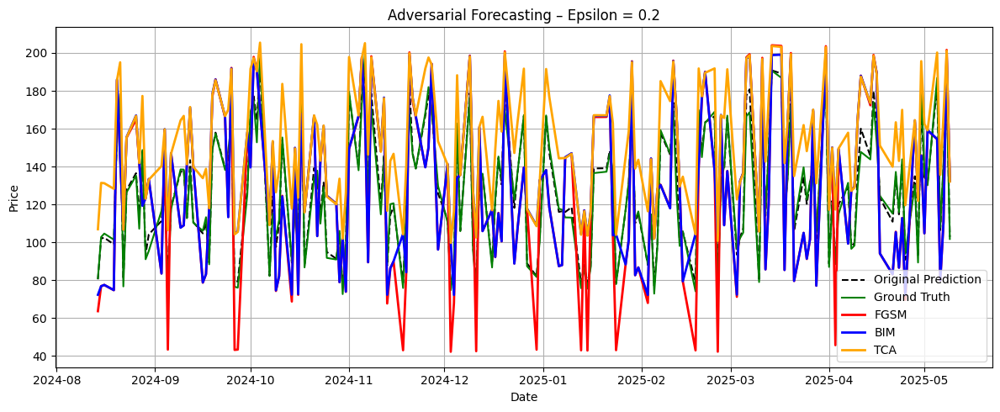

In [ ]:
epsilon_values = [0.01, 0.1, 0.2]

# Couleurs personnalisées
colors = {
    "FGSM": "red",
    "BIM": "blue",
    "TCA": "orange"
}

for eps in epsilon_values:
    alpha = eps / 10
    iters = 10 if eps < 0.2 else 20

    methods = {
        "FGSM": lambda eps: run_attack(model_google_RNN, loss_fn, test_loader, fgsm_attack, epsilon=eps),
        "BIM":  lambda eps: run_attack(model_google_RNN, loss_fn, test_loader, bim_attack, epsilon=eps, alpha=alpha, num_iter=iters),
        "TCA":  lambda eps: run_attack(model_google_RNN, loss_fn, test_loader, tca_attack, epsilon=eps),
    }

    plt.figure(figsize=(12, 5))
    plt.title(f"Adversarial Forecasting – Epsilon = {eps}")

    true_vals_plot = None
    pred_vals_plot = predictions_denorm
    plt.plot(test_dates, pred_vals_plot, label="Original Prediction", linestyle="--", color="black")

    for method_name, attack_fn in methods.items():
        adv_preds, true_vals = attack_fn(eps)
        adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
        true_vals_denorm = denormalize(true_vals, price_min, price_max)

        if true_vals_plot is None:
            true_vals_plot = true_vals_denorm
            plt.plot(test_dates, true_vals_plot, label="Ground Truth", color="green")

        mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
        sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
        rsme = np.sqrt(mean_squared_error(true_vals_denorm, adv_preds_denorm))
        print(f"{method_name} – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")
        res_tab.loc[('RNN', 'MAE'), (method_name, f"{eps:.2f}")] = mae
        res_tab.loc[('RNN', 'SIM'), (method_name, f"{eps:.2f}")] = sim
        res_tab.loc[('RNN', 'RSME'), (method_name, f"{eps:.2f}")] = rsme
        plt.plot(test_dates, adv_preds_denorm, label=method_name, linewidth=2, color=colors[method_name])

    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## CNN PART

In [ ]:
model_google_CNN = SimpleCNN(input_channels=5, output_size=1)
loss_fn = nn.MSELoss()
optimizer = torch.optim.Adam(model_google_CNN.parameters(), lr=0.01)
num_epochs = 10

train_model_with_validation(model_google_CNN, loss_fn, optimizer, num_epochs, train_loader, val_loader, sequence_length)

Epoch [1/10], Train Loss: 0.0278, Validation Loss: 0.0052
Epoch [2/10], Train Loss: 0.0037, Validation Loss: 0.0032
Epoch [3/10], Train Loss: 0.0029, Validation Loss: 0.0025
Epoch [4/10], Train Loss: 0.0028, Validation Loss: 0.0031
Epoch [5/10], Train Loss: 0.0030, Validation Loss: 0.0036
Epoch [6/10], Train Loss: 0.0033, Validation Loss: 0.0025
Epoch [7/10], Train Loss: 0.0030, Validation Loss: 0.0024
Epoch [8/10], Train Loss: 0.0031, Validation Loss: 0.0032
Epoch [9/10], Train Loss: 0.0028, Validation Loss: 0.0027
Epoch [10/10], Train Loss: 0.0028, Validation Loss: 0.0027


In [ ]:
model_google_CNN.eval()
with torch.no_grad():
    real_values = []
    predicted_values = []
    test_indices = []
    for i, (inputs, labels) in enumerate(test_loader):
        outputs = model_google_CNN(inputs)
        real_values.append(labels.cpu().numpy())
        predicted_values.append(outputs.cpu().numpy())


        batch_size = inputs.shape[0]
        start_idx = train_size + val_size + i * test_loader.batch_size
        end_idx = min(start_idx + batch_size, len(dates))
        test_indices.extend(range(start_idx, end_idx))

real_values = np.concatenate(real_values).squeeze()
predicted_values = np.concatenate(predicted_values).squeeze()
test_dates = [dates[i] for i in test_indices]

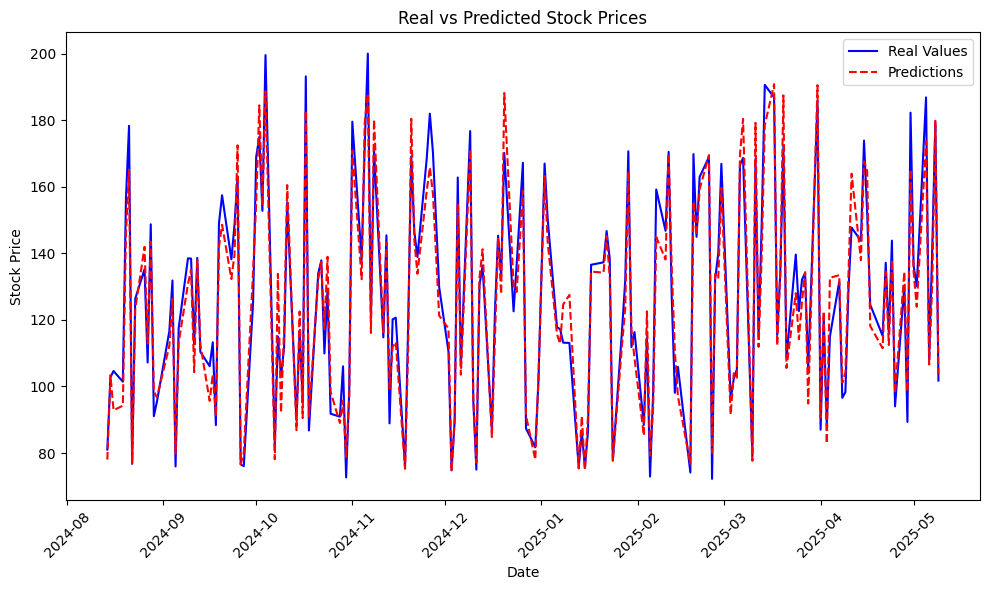

In [ ]:
# Denormalize
true_values_denorm = real_values * (price_max - price_min) + price_min
predictions_denorm = predicted_values * (price_max - price_min) + price_min
mae = mean_absolute_error(true_values_denorm, predictions_denorm)
sim = scalar_similarity(true_values_denorm, predictions_denorm)
rsme = np.sqrt(mean_squared_error(true_vals_denorm, predictions_denorm))

res_tab.loc[('CNN', 'MAE'), ('NA', '0.00')] = mae
res_tab.loc[('CNN', 'SIM'), ('NA', '0.00')] = sim
res_tab.loc[('CNN', 'RSME'), ('NA', '0.00')] = rsme

plt.figure(figsize=(10,6))
plt.plot(test_dates, true_values_denorm, label='Real Values', color='blue')
plt.plot(test_dates, predictions_denorm, label='Predictions', color='red', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.title('Real vs Predicted Stock Prices')
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

FGSM – Epsilon 0.01 – Adversarial MAE: 7.4801 | SIM: 0.9979
BIM – Epsilon 0.01 – Adversarial MAE: 7.4791 | SIM: 0.9979
TCA – Epsilon 0.01 – Adversarial MAE: 6.0084 | SIM: 0.9984


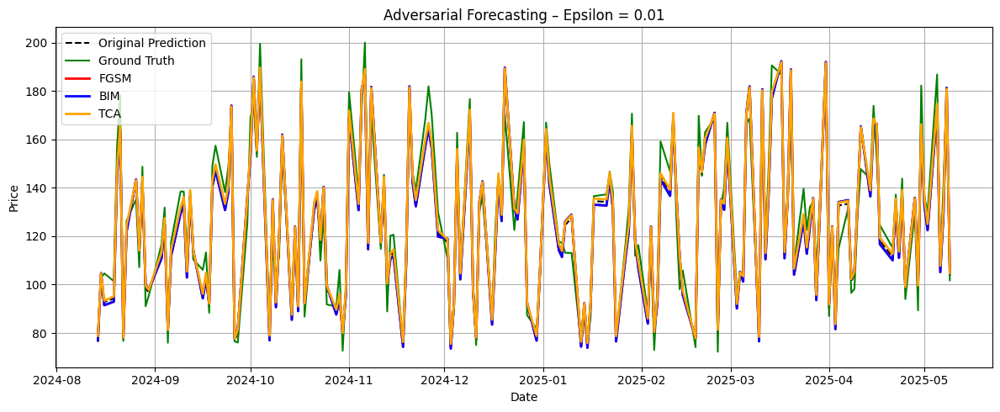

FGSM – Epsilon 0.1 – Adversarial MAE: 19.8899 | SIM: 0.9876
BIM – Epsilon 0.1 – Adversarial MAE: 19.7124 | SIM: 0.9878
TCA – Epsilon 0.1 – Adversarial MAE: 11.0374 | SIM: 0.9981


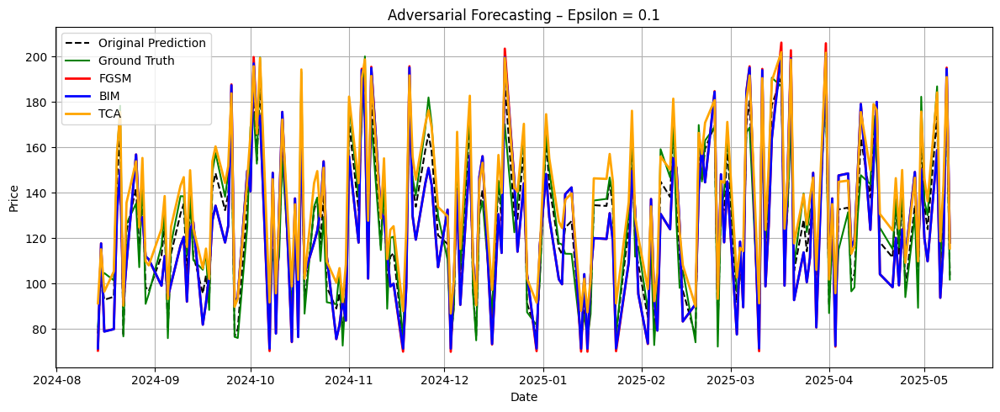

FGSM – Epsilon 0.2 – Adversarial MAE: 32.8247 | SIM: 0.9664
BIM – Epsilon 0.2 – Adversarial MAE: 31.8308 | SIM: 0.9681
TCA – Epsilon 0.2 – Adversarial MAE: 22.4117 | SIM: 0.9978


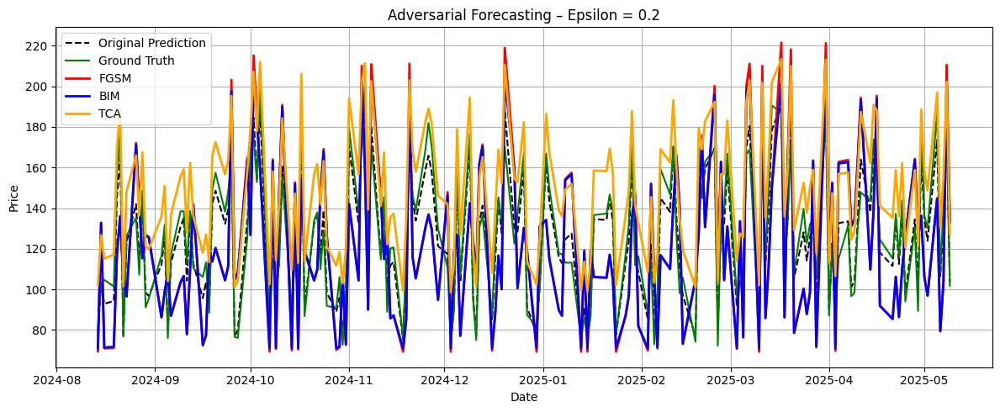

In [ ]:
epsilon_values = [0.01, 0.1, 0.2]

# Couleurs personnalisées
colors = {
    "FGSM": "red",
    "BIM": "blue",
    "TCA": "orange"
}

for eps in epsilon_values:
    alpha = eps / 10
    iters = 10 if eps < 0.2 else 20

    methods = {
        "FGSM": lambda eps: run_attack(model_google_CNN, loss_fn, test_loader, fgsm_attack, epsilon=eps),
        "BIM":  lambda eps: run_attack(model_google_CNN, loss_fn, test_loader, bim_attack, epsilon=eps, alpha=alpha, num_iter=iters),
        "TCA":  lambda eps: run_attack(model_google_CNN, loss_fn, test_loader, tca_attack, epsilon=eps),
    }

    plt.figure(figsize=(12, 5))
    plt.title(f"Adversarial Forecasting – Epsilon = {eps}")

    true_vals_plot = None
    pred_vals_plot = predictions_denorm
    plt.plot(test_dates, pred_vals_plot, label="Original Prediction", linestyle="--", color="black")

    for method_name, attack_fn in methods.items():
        adv_preds, true_vals = attack_fn(eps)
        adv_preds_denorm = denormalize(adv_preds, price_min, price_max)
        true_vals_denorm = denormalize(true_vals, price_min, price_max)

        if true_vals_plot is None:
            true_vals_plot = true_vals_denorm
            plt.plot(test_dates, true_vals_plot, label="Ground Truth", color="green")

        mae = mean_absolute_error(true_vals_denorm, adv_preds_denorm)
        sim = scalar_similarity(true_vals_denorm, adv_preds_denorm)
        rsme = np.sqrt(mean_squared_error(true_vals_denorm, adv_preds_denorm))
        print(f"{method_name} – Epsilon {eps} – Adversarial MAE: {mae:.4f} | SIM: {sim:.4f}")
        res_tab.loc[('CNN', 'MAE'), (method_name, f"{eps:.2f}")] = mae
        res_tab.loc[('CNN', 'SIM'), (method_name, f"{eps:.2f}")] = sim
        res_tab.loc[('CNN', 'RSME'), (method_name, f"{eps:.2f}")] = rsme
        plt.plot(test_dates, adv_preds_denorm, label=method_name, linewidth=2, color=colors[method_name])

    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


## PLOT RESULT TAB

In [ ]:
display(res_tab)

Attack              NA      FGSM                             BIM             \
ε                 0.00      0.01       0.10       0.20      0.01       0.10   
Model Metric                                                                  
LSTM  MAE     3.903501  5.302508  17.915747  31.844437  5.302393  17.856169   
      RSME    4.950690  6.110282  18.162934  31.987299  6.110180  18.118870   
      SIM     0.999585  0.999407   0.995349   0.987010  0.999407   0.995331   
RNN   MAE     2.922667  4.292816  16.528160  29.955389  4.292401  16.513077   
      RSME    4.052215  5.128785  16.788500  30.220536  5.128366  16.781485   
      SIM     0.999548  0.999269   0.992138   0.974198  0.999269   0.992143   
CNN   MAE     6.070324  7.480101  19.889950  32.824696  7.479107  19.712442   
      SIM     0.998442  0.997882   0.987571   0.966388  0.997883   0.987773   
      RSME    7.385866  8.604178  20.546254  33.685353  8.602425  20.390343   

Attack                        TCA                        
ε                  0.20      0.01       0.10       0.20  
Model Metric                                             
LSTM  MAE     31.351542  4.925407  16.629303  29.988728  
      RSME    31.592698  5.913366  17.020964  30.206296  
      SIM      0.986854  0.999568   0.999275   0.998533  
RNN   MAE     29.404230  3.334754  14.360861  27.503611  
      RSME    29.771832  4.564830  14.908246  27.964275  
      SIM      0.976025  0.999539   0.999221   0.997915  
CNN   MAE     31.830757  6.008435  11.037389  22.411736  
      SIM      0.968089  0.998414   0.998108   0.997776  
      RSME    32.745068  7.352435  12.971746  23.557864

## Analysis and Question

* As observed in the temperature prediction dataset, the results for FGSM and BIM attacks are surprisingly similar across all models (LSTM, RNN, CNN), particularly in terms of MAE and RMSE. This is counter-intuitive, as BIM is designed to be a stronger iterative version of FGSM. In most literature, BIM tends to lead to larger perturbations and more severe degradation in performance.

* Moreover, across all models, TCA tends to produce the highest SIM values among all attacks, which aligns with its design principle: maintaining structural similarity while degrading predictive accuracy.
However, TCA often results in lower MAE and RMSE compared to FGSM/BIM, especially at higher perturbation levels(ε). This suggests that while TCA is more stealthy, its impact on prediction accuracy is generally less severe than FGSM or BIM. This behavior is consistent with the trade-off TCA is designed for: preserving the temporal structure of the original signal (hence high SIM) at the cost of achieving less drastic prediction errors. This makes TCA potentially more dangerous in practice, as its higher stealthiness can evade detection despite causing smaller but consistent degradations in performance.